# Выпускная работа Прогнозирование конечных свойств новых материалов (композиционных материалов)

In [3]:
# Подгружаем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rc('figure', max_open_warning = 0)
import seaborn as sns
sns.set(style="whitegrid")
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

## Загружаем исходные данные 

In [4]:
# первую колонку (порядковый номер) использем как индекс
df_bp = pd.read_excel('C:\VKR/X_bp.xlsx', index_col=0)
df_bp

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [5]:
# первую колонку (порядковый номер) использем как индекс
df_nup = pd.read_excel("C:\VKR/X_nup.xlsx", index_col=0)
df_nup

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.000000,57.000000
1.0,0.0,4.000000,60.000000
2.0,0.0,4.000000,70.000000
3.0,0.0,5.000000,47.000000
4.0,0.0,5.000000,57.000000
...,...,...,...
1035.0,90.0,8.088111,47.759177
1036.0,90.0,7.619138,66.931932
1037.0,90.0,9.800926,72.858286
1038.0,90.0,10.079859,65.519479


In [6]:
# проводим объединение загруженных датасетов по индексу тип объединения INNER
df_bn = df_bp.merge(df_nup, left_index = True, right_index = True, how = 'inner')
df_bn

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [7]:
# посмотрим параметры полученного DataFrama
df_bn.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

In [8]:
# рассчитаем основные статистические показатели
df_bn.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


<Figure size 504x216 with 0 Axes>

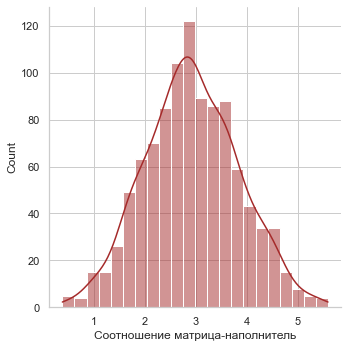

<Figure size 504x216 with 0 Axes>

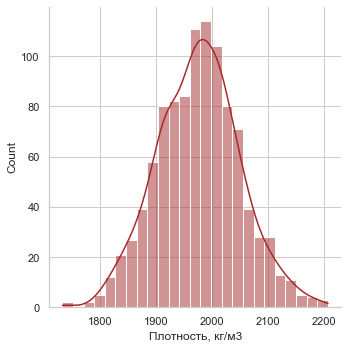

<Figure size 504x216 with 0 Axes>

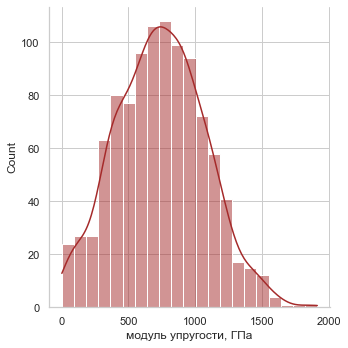

<Figure size 504x216 with 0 Axes>

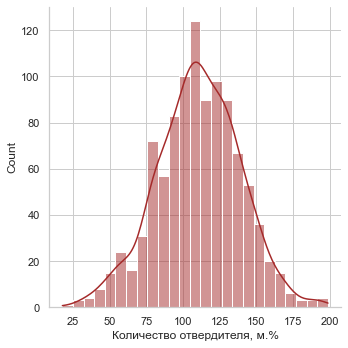

<Figure size 504x216 with 0 Axes>

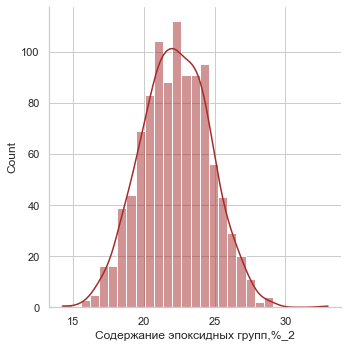

<Figure size 504x216 with 0 Axes>

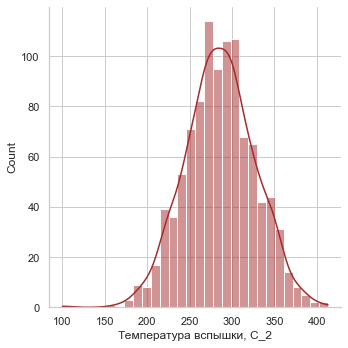

<Figure size 504x216 with 0 Axes>

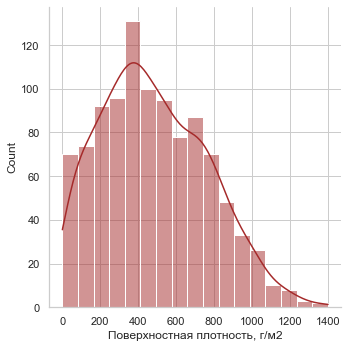

<Figure size 504x216 with 0 Axes>

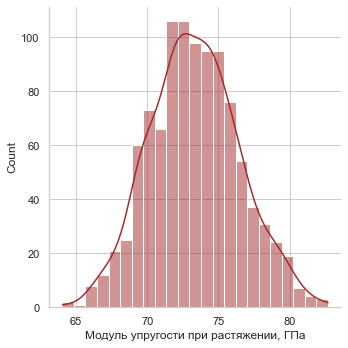

<Figure size 504x216 with 0 Axes>

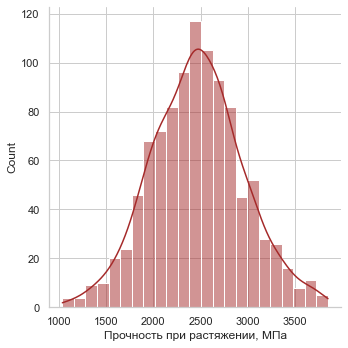

<Figure size 504x216 with 0 Axes>

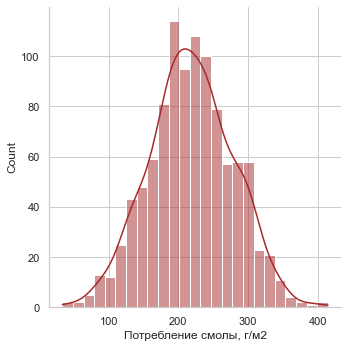

<Figure size 504x216 with 0 Axes>

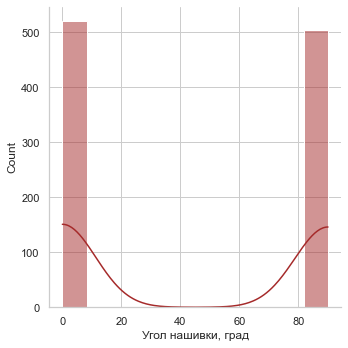

<Figure size 504x216 with 0 Axes>

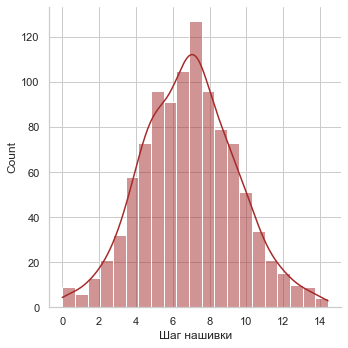

<Figure size 504x216 with 0 Axes>

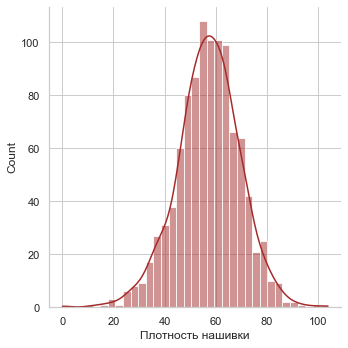

In [9]:
# построим гистограммы распределения для каждого из параметров
for i in df_bn.columns:
    plt.figure(figsize=(7, 3))
    sns.displot(x=i, kde=True, color='Brown', data=df_bn);

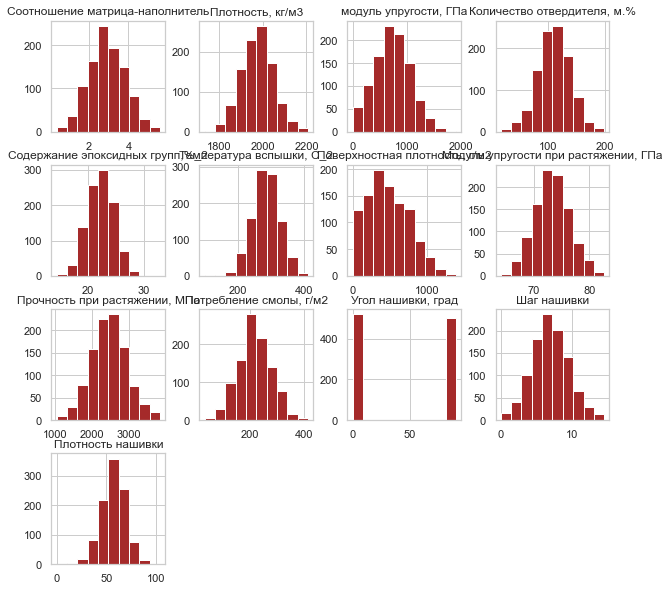

In [10]:
# построим сводную гистаграмму распределения по каждому параметру
df_bn.hist(figsize=(10,10), color = 'Brown')
plt.show()    

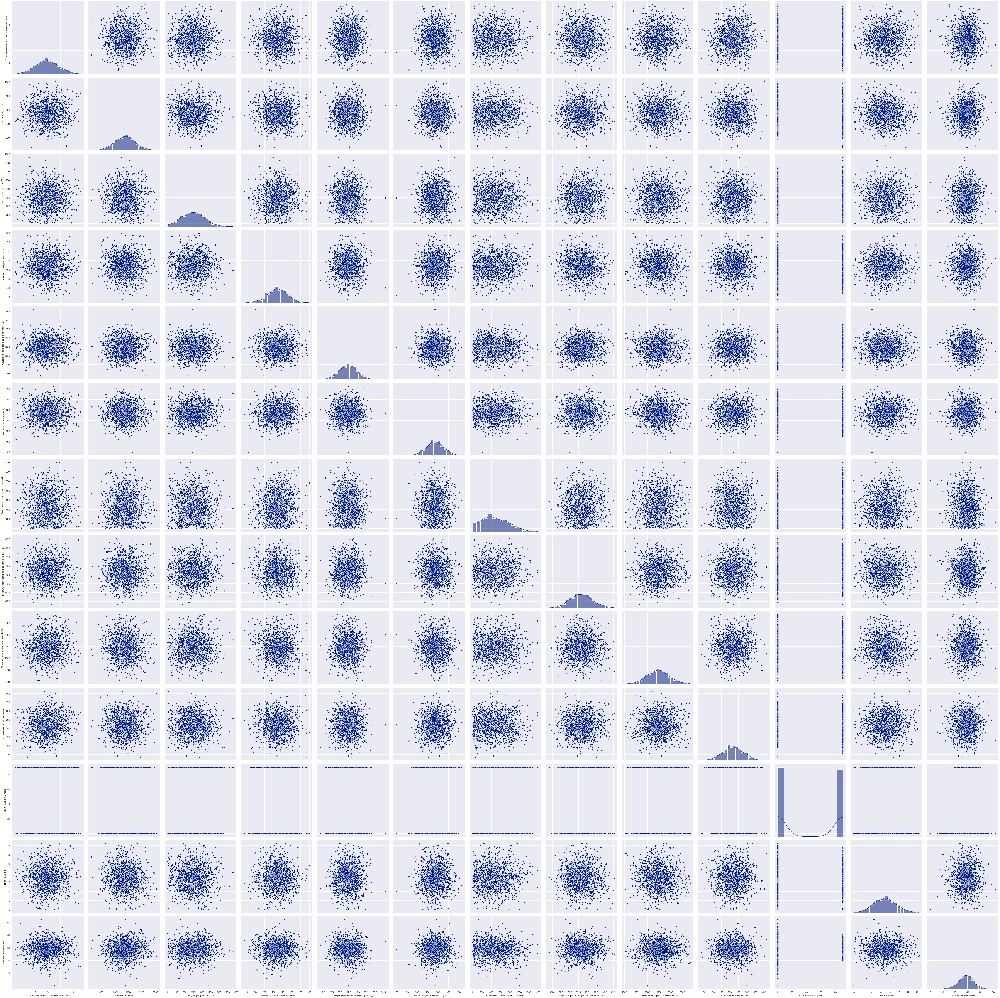

In [11]:
# построим попарные графики рассеяния 
for i in df_bn.columns:
    sns.set(palette="dark")

g = sns.PairGrid(df_bn, diag_sharey=True, height=5)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.scatterplot);

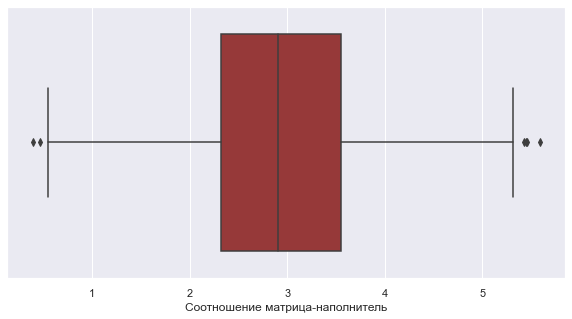

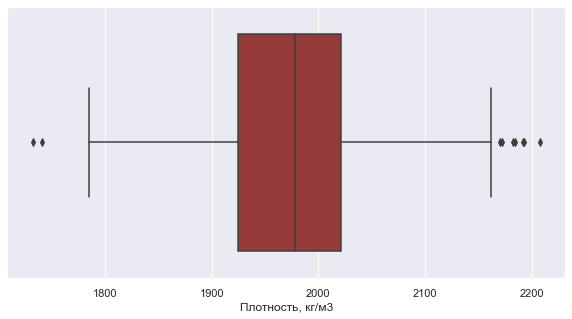

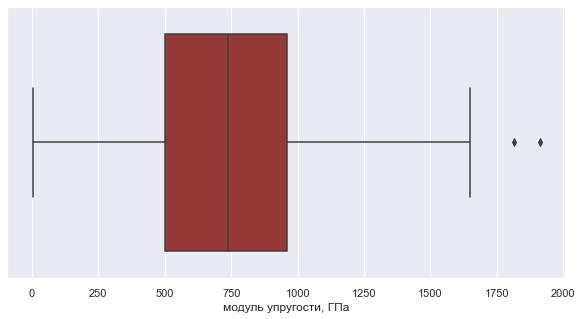

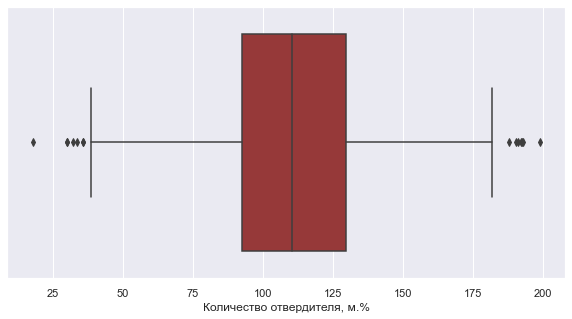

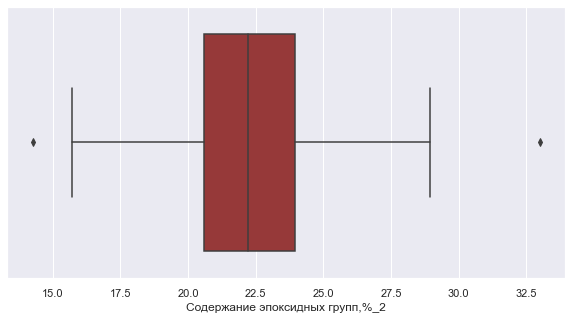

...

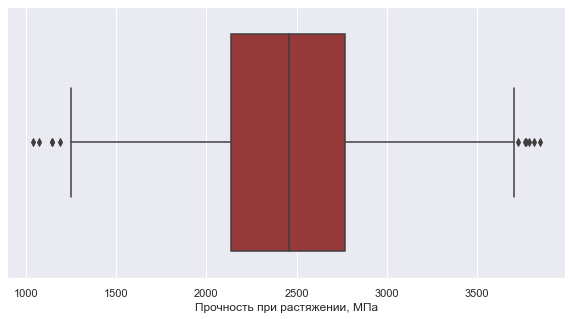

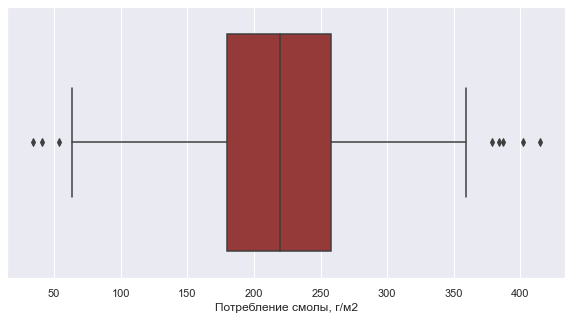

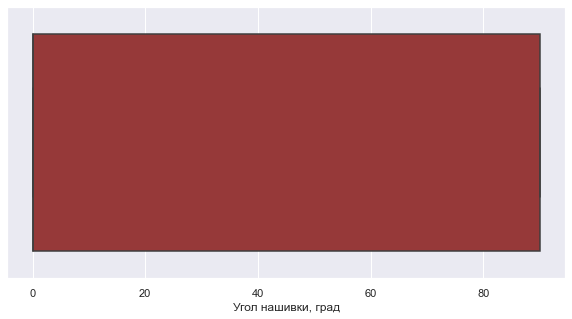

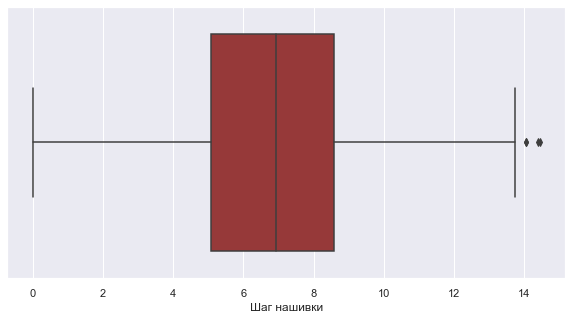

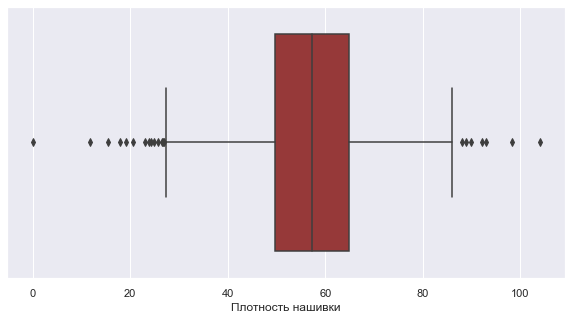

In [12]:
# для определения выбросов построим диаграмму BOXPLOT "ящик с усами" 
for i in df_bn.columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=i, data = df_bn, orient = 'h', color='brown');

In [13]:
# выведем список выбросов, которые находятся за пределами BOXPLOT "ящик с усами"
for i in df_bn.columns:
    q25 = df_bn[i].quantile(0.25)
    q75 = df_bn[i].quantile(0.75)
    iqr = q75 - q25
    low_b = q25 - 1.5*iqr
    up_b = q75 + 1.5*iqr
    df_bn.loc[df_bn[i]<low_b,i]
    df_bn.loc[df_bn[i]>up_b,i] 
    print(df_bn.loc[df_bn[i]<low_b,i])
    print(df_bn.loc[df_bn[i]>up_b,i])

378.0    0.463342
673.0    0.389403
Name: Соотношение матрица-наполнитель, dtype: float64
237.0    5.591742
284.0    5.425139
505.0    5.452959
877.0    5.455566
Name: Соотношение матрица-наполнитель, dtype: float64
873.0    1740.657496
918.0    1731.764635
Name: Плотность, кг/м3, dtype: float64
100.0    2207.773481
224.0    2182.751822
251.0    2172.246796
264.0    2192.297637
317.0    2184.493200
499.0    2170.342363
626.0    2192.738783
Name: Плотность, кг/м3, dtype: float64
Series([], Name: модуль упругости, ГПа, dtype: float64)
592.0    1911.536477
770.0    1815.865170
Name: модуль упругости, ГПа, dtype: float64
0.0      30.000000
208.0    35.620904
257.0    17.740275
448.0    33.624187
511.0    32.019222
535.0    29.956150
819.0    35.599697
Name: Количество отвердителя, м.%, dtype: float64
94.0     191.053004
412.0    198.953207
495.0    192.851702
503.0    192.705385
800.0    188.049898
867.0    190.318107
958.0    192.334469
Name: Количество отвердителя, м.%, dtype: float64
29

In [14]:
# стандартизируем DataFrame для определения выбросов 
scaler = preprocessing.StandardScaler()
df_bn_st = pd.DataFrame(scaler.fit_transform(df_bn), columns = df_bn.columns, index = df_bn.index)
df_bn_st.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,-1.175779,0.736365,-0.003594,-2.848828,0.009757,-4.542215,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-1.131530,-0.012469
1.0,-1.175779,0.736365,-0.003594,-2.141666,0.626001,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-1.131530,0.230546
2.0,-1.175779,0.736365,-0.003594,-2.145202,4.471955,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-1.131530,1.040595
3.0,-1.175779,0.736365,-0.003594,0.651622,-0.413446,0.344984,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-0.741243,-0.822518
4.0,-0.174232,0.736365,0.039618,0.045585,0.009757,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-0.741243,-0.012469
5.0,-0.177971,0.329272,0.024470,0.045585,0.009757,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-0.741243,0.230546
6.0,-0.395218,-0.892008,0.203220,0.045585,0.009757,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-0.741243,1.040595
7.0,-0.404141,-1.027705,-0.620848,0.045585,0.009757,-0.030955,-0.365363,0.536151,-1.373992,-1.648443,-0.983518,0.039332,-0.822518
8.0,0.686534,-0.620612,0.451652,0.651622,-0.413446,0.344984,-0.365363,0.536151,-1.373992,-1.648443,-0.983518,0.039332,-0.012469
9.0,0.659497,1.686250,2.063430,0.651622,-0.413446,0.344984,1.875217,1.498474,-0.961953,1.366293,-0.983518,0.039332,0.230546


In [15]:
# проведем поиск выбросов с помощью метода 3 сигм
for i in df_bn_st.columns:
    df_bn_st[i] - abs((df_bn_st[i] - df_bn_st[i].mean()) / df_bn_st[i].std())
    print(f"{sum(df_bn_st[i] > 3)} выбросов в параметре {i}")
    print(f"{sum(df_bn_st[i] < -3)} выбросов в параметре {i}")
print(f'Всего {sum(sum(df_bn_st.values > 3))} выбросов')
print(f'Всего {sum(sum(df_bn_st.values < -3))} выбросов')

0 выбросов в параметре Соотношение матрица-наполнитель
0 выбросов в параметре Соотношение матрица-наполнитель
1 выбросов в параметре Плотность, кг/м3
2 выбросов в параметре Плотность, кг/м3
2 выбросов в параметре модуль упругости, ГПа
0 выбросов в параметре модуль упругости, ГПа
1 выбросов в параметре Количество отвердителя, м.%
1 выбросов в параметре Количество отвердителя, м.%
1 выбросов в параметре Содержание эпоксидных групп,%_2
1 выбросов в параметре Содержание эпоксидных групп,%_2
1 выбросов в параметре Температура вспышки, С_2
2 выбросов в параметре Температура вспышки, С_2
2 выбросов в параметре Поверхностная плотность, г/м2
0 выбросов в параметре Поверхностная плотность, г/м2
1 выбросов в параметре Модуль упругости при растяжении, ГПа
0 выбросов в параметре Модуль упругости при растяжении, ГПа
0 выбросов в параметре Прочность при растяжении, МПа
0 выбросов в параметре Прочность при растяжении, МПа
2 выбросов в параметре Потребление смолы, г/м2
1 выбросов в параметре Потреблени

## Проведем нормализацию DataFrame


In [16]:
# с помощью функции MinMaxScaler проведем нормализацтию 
scaler = preprocessing.MinMaxScaler()
df_bn_n1 = pd.DataFrame(scaler.fit_transform(df_bn), columns = df_bn.columns, index = df_bn.index)
df_bn_n1.head(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.548135
1.0,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.576985
2.0,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.673149
3.0,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.451971
4.0,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.548135


In [17]:
# рассчитаем для нормализованных данных описательную статистику и посмотрим min и max значения
df_bn_n1.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,0.488427,0.175541,0.0,0.370696,0.483912,0.608045,1.0
"Плотность, кг/м3",1023.0,0.512533,0.154890,0.0,0.404175,0.516497,0.608413,1.0
"модуль упругости, ГПа",1023.0,0.386301,0.172978,0.0,0.260652,0.386165,0.502528,1.0
"Количество отвердителя, м.%",1023.0,0.512273,0.156147,0.0,0.412240,0.512240,0.618003,1.0
"Содержание эпоксидных групп,%_2",1023.0,0.426215,0.128370,0.0,0.338919,0.425487,0.517842,1.0
"Температура вспышки, С_2",1023.0,0.593354,0.130695,0.0,0.507756,0.593401,0.679924,1.0
"Поверхностная плотность, г/м2",1023.0,0.344638,0.201092,0.0,0.190296,0.322574,0.495105,1.0
"Модуль упругости при растяжении, ГПа",1023.0,0.497880,0.167435,0.0,0.386030,0.494672,0.606751,1.0
"Прочность при растяжении, МПа",1023.0,0.508634,0.172724,0.0,0.390881,0.506003,0.615432,1.0
"Потребление смолы, г/м2",1023.0,0.484838,0.156875,0.0,0.382955,0.486875,0.587411,1.0


<AxesSubplot:xlabel='variable', ylabel='value'>

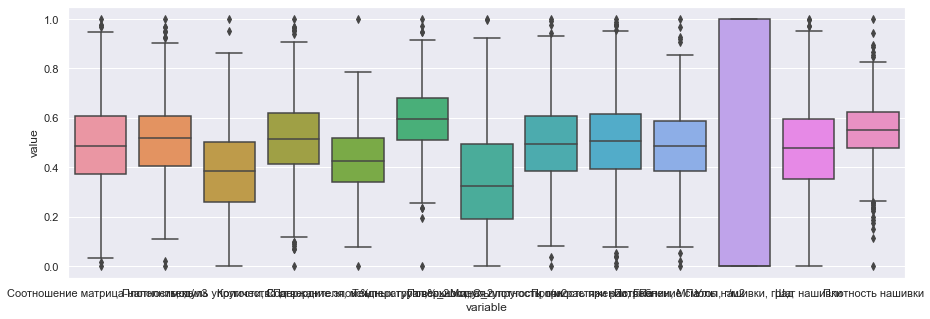

In [18]:
# выведем сводную диаграмму BOXPLOT для нормализованных данных
plt.figure(figsize=(15, 5))
sns.boxplot(x="variable", y="value", data=pd.melt(df_bn_n1))

In [19]:
# По каждому параметру наблюдаем значения, которые выходят за границы ящика с усами. Находим их значения и заменяем 
# на пустые значения nan
for i in df_bn.columns:
    q25 = df_bn[i].quantile(0.25)
    q75 = df_bn[i].quantile(0.75)
    iqr = q75 - q25
    low_b = q25 - 1.5*iqr
    up_b = q75 + 1.5*iqr
    df_bn.loc[df_bn[i]<low_b,i] = np.nan
    df_bn.loc[df_bn[i]>up_b,i] = np.nan    

In [20]:
# Осущетвляем замену пустых значений nan на средние значения n_neighbors ближайших соседей
imputer = KNNImputer(n_neighbors = 4)
df_bn_K1 = pd.DataFrame(imputer.fit_transform(df_bn), columns = df_bn.columns, index = df_bn.index)
df_bn_K1

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.000000,738.736842,85.190000,22.267857,288.461538,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2.0,1.857143,2030.000000,738.736842,49.900000,22.638393,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [21]:
# Проведем нормализацию данных после замены выбросов 
scaler = preprocessing.MinMaxScaler()
df_bn_n2 = pd.DataFrame(scaler.fit_transform(df_bn_K1), columns = df_bn_K1.columns, index = df_bn_K1.index)
df_bn_n2

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.274768,0.651097,0.447061,0.324962,0.495653,0.527772,0.162230,0.280303,0.712590,0.529221,0.0,0.291282,0.506083
1.0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.291282,0.557156
2.0,0.274768,0.651097,0.447061,0.078454,0.523599,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.291282,0.727399
3.0,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.162230,0.280303,0.712590,0.529221,0.0,0.364102,0.335840
4.0,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.364102,0.506083
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,0.361662,0.444480,0.552781,0.337550,0.333908,0.703458,0.161609,0.475147,0.463043,0.207613,1.0,0.660946,0.336177
1019.0,0.607674,0.704373,0.268550,0.749605,0.294428,0.362087,0.271207,0.464422,0.452087,0.182974,1.0,0.769393,0.450768
1020.0,0.573391,0.498274,0.251612,0.501991,0.623085,0.334063,0.572959,0.578740,0.575296,0.585446,1.0,0.303017,0.687046
1021.0,0.662497,0.748688,0.448724,0.717585,0.267818,0.466417,0.496511,0.535142,0.334513,0.451779,1.0,0.459730,0.527552


In [22]:
# рассчитаем для нормализованных данных описательную статистику и посмотрим min и max значения
df_bn_n2.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,0.499018,0.187261,0.0,0.372092,0.494988,0.629650,1.0
"Плотность, кг/м3",1023.0,0.504649,0.187929,0.0,0.371411,0.512036,0.626245,1.0
"модуль упругости, ГПа",1023.0,0.446352,0.198227,0.0,0.302135,0.447061,0.579819,1.0
"Количество отвердителя, м.%",1023.0,0.501215,0.186926,0.0,0.375853,0.501200,0.632756,1.0
"Содержание эпоксидных групп,%_2",1023.0,0.493588,0.178751,0.0,0.370859,0.492854,0.623384,1.0
"Температура вспышки, С_2",1023.0,0.515617,0.190562,0.0,0.387036,0.514949,0.644959,1.0
"Поверхностная плотность, г/м2",1023.0,0.372200,0.215776,0.0,0.206249,0.349188,0.535907,1.0
"Модуль упругости при растяжении, ГПа",1023.0,0.489154,0.191866,0.0,0.361445,0.486357,0.615795,1.0
"Прочность при растяжении, МПа",1023.0,0.494641,0.189721,0.0,0.364342,0.491998,0.613140,1.0
"Потребление смолы, г/м2",1023.0,0.523199,0.195534,0.0,0.393568,0.526509,0.655067,1.0


<AxesSubplot:xlabel='variable', ylabel='value'>

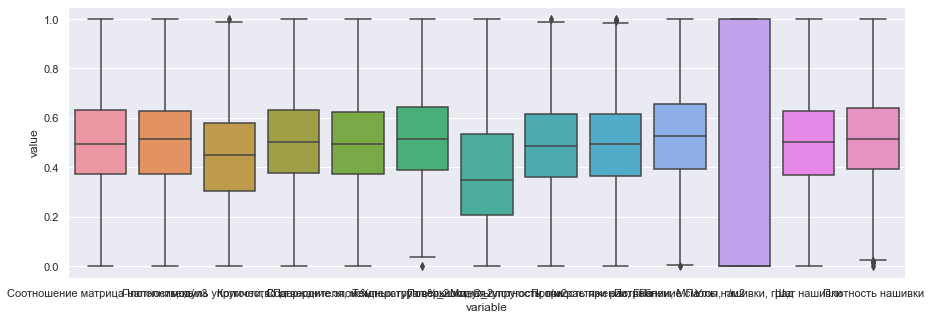

In [23]:
 # выведем сводную диаграмму BOXPLOT по нормализованным данным 
plt.figure(figsize=(15, 5))
sns.boxplot(x="variable", y="value", data=pd.melt(df_bn_n2))

In [24]:
# Параметров по которым наблюдаем значения, выходящие за границы ящика с усами стало меньше, но они остались.
# Поэтому проводим вторично замену выбросов на пустые значения nan
for i in df_bn_K1.columns:
    q25 = df_bn_K1[i].quantile(0.25)
    q75 = df_bn_K1[i].quantile(0.75)
    iqr = q75 - q25
    low_b = q25 - 1.5*iqr
    up_b = q75 + 1.5*iqr
    df_bn_K1.loc[df_bn_K1[i]<low_b,i] = np.nan
    df_bn_K1.loc[df_bn_K1[i]>up_b,i] = np.nan    

In [25]:
df_bn_K1.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                1
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       4
dtype: int64

In [26]:
# Осущетвляем замену пустых значений nan на средние значения n_neighbors ближайших соседей
imputer = KNNImputer(n_neighbors = 4)
df_bn_K2 = pd.DataFrame(imputer.fit_transform(df_bn_K1), columns = df_bn_K1.columns, index = df_bn_K1.index)
df_bn_K2

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.000000,738.736842,85.190000,22.267857,288.461538,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2.0,1.857143,2030.000000,738.736842,49.900000,22.638393,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [27]:
# Проведем нормализацию данных после замены выбросов 
scaler = preprocessing.MinMaxScaler()
df_bn_n3 = pd.DataFrame(scaler.fit_transform(df_bn_K2), columns = df_bn_K2.columns, index = df_bn_K2.index)
df_bn_n3

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.274768,0.651097,0.452951,0.324962,0.495653,0.510890,0.162230,0.284135,0.725961,0.527881,0.0,0.291282,0.494123
1.0,0.274768,0.651097,0.452951,0.079153,0.607435,0.491617,0.162230,0.284135,0.725961,0.527881,0.0,0.291282,0.546433
2.0,0.274768,0.651097,0.452951,0.078454,0.523599,0.491617,0.162230,0.284135,0.725961,0.527881,0.0,0.291282,0.720799
3.0,0.274768,0.651097,0.452951,0.630983,0.418887,0.568710,0.162230,0.284135,0.725961,0.527881,0.0,0.364102,0.319758
4.0,0.466552,0.651097,0.461725,0.511257,0.495653,0.491617,0.162230,0.284135,0.725961,0.527881,0.0,0.364102,0.494123
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,0.361662,0.444480,0.560064,0.337550,0.333908,0.692856,0.161609,0.481643,0.471731,0.205357,1.0,0.660946,0.320103
1019.0,0.607674,0.704373,0.272088,0.749605,0.294428,0.339281,0.271207,0.470772,0.460570,0.180648,1.0,0.769393,0.437468
1020.0,0.573391,0.498274,0.254927,0.501991,0.623085,0.310256,0.572959,0.586653,0.586091,0.584266,1.0,0.303017,0.679468
1021.0,0.662497,0.748688,0.454635,0.717585,0.267818,0.447342,0.496511,0.542458,0.340790,0.450218,1.0,0.459730,0.516112


In [28]:
# рассчитаем для нормализованных данных описательную статистику и посмотрим min и max значения
df_bn_n3.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,0.499018,0.187261,0.0,0.372092,0.494988,0.629650,1.0
"Плотность, кг/м3",1023.0,0.504649,0.187929,0.0,0.371411,0.512036,0.626245,1.0
"модуль упругости, ГПа",1023.0,0.451881,0.200170,0.0,0.306116,0.452951,0.587458,1.0
"Количество отвердителя, м.%",1023.0,0.501215,0.186926,0.0,0.375853,0.501200,0.632756,1.0
"Содержание эпоксидных групп,%_2",1023.0,0.493588,0.178751,0.0,0.370859,0.492854,0.623384,1.0
"Температура вспышки, С_2",1023.0,0.498738,0.196684,0.0,0.365698,0.497609,0.632266,1.0
"Поверхностная плотность, г/м2",1023.0,0.372200,0.215776,0.0,0.206249,0.349188,0.535907,1.0
"Модуль упругости при растяжении, ГПа",1023.0,0.495326,0.193813,0.0,0.366387,0.492747,0.623864,1.0
"Прочность при растяжении, МПа",1023.0,0.501818,0.190620,0.0,0.371178,0.500056,0.623007,1.0
"Потребление смолы, г/м2",1023.0,0.522260,0.195426,0.0,0.392084,0.525161,0.654085,1.0


<AxesSubplot:xlabel='variable', ylabel='value'>

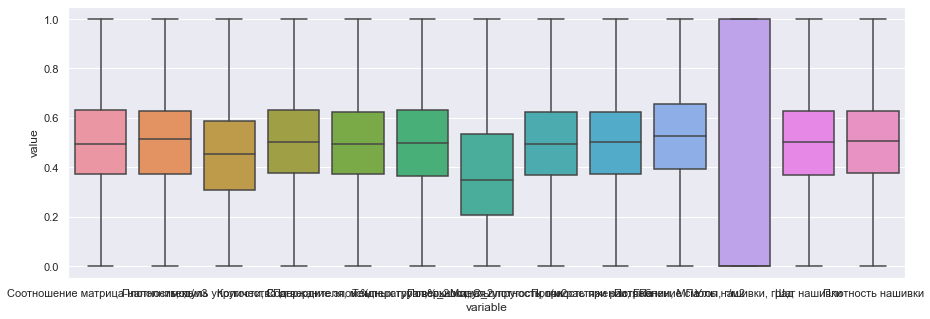

In [29]:
# выведем сводную диаграмму BOXPLOT по нормализованным данным 
plt.figure(figsize=(15, 5))
sns.boxplot(x="variable", y="value", data=pd.melt(df_bn_n3))

In [30]:
# выведем список выбросов, которые находятся за пределами BOXPLOT "ящик с усами"
for i in df_bn_n3.columns:
    q25 = df_bn_n3[i].quantile(0.25)
    q75 = df_bn_n3[i].quantile(0.75)
    iqr = q75 - q25
    low_b = q25 - 1.5*iqr
    up_b = q75 + 1.5*iqr
    df_bn_n3.loc[df_bn_n3[i]<low_b,i]
    df_bn_n3.loc[df_bn_n3[i]>up_b,i] 
    print(df_bn_n3.loc[df_bn_n3[i]<low_b,i])
    print(df_bn_n3.loc[df_bn_n3[i]>up_b,i])

Series([], Name: Соотношение матрица-наполнитель, dtype: float64)
Series([], Name: Соотношение матрица-наполнитель, dtype: float64)
Series([], Name: Плотность, кг/м3, dtype: float64)
Series([], Name: Плотность, кг/м3, dtype: float64)
Series([], Name: модуль упругости, ГПа, dtype: float64)
Series([], Name: модуль упругости, ГПа, dtype: float64)
Series([], Name: Количество отвердителя, м.%, dtype: float64)
Series([], Name: Количество отвердителя, м.%, dtype: float64)
Series([], Name: Содержание эпоксидных групп,%_2, dtype: float64)
Series([], Name: Содержание эпоксидных групп,%_2, dtype: float64)
Series([], Name: Температура вспышки, С_2, dtype: float64)
Series([], Name: Температура вспышки, С_2, dtype: float64)
Series([], Name: Поверхностная плотность, г/м2, dtype: float64)
Series([], Name: Поверхностная плотность, г/м2, dtype: float64)
Series([], Name: Модуль упругости при растяжении, ГПа, dtype: float64)
Series([], Name: Модуль упругости при растяжении, ГПа, dtype: float64)
Series([],

In [31]:
# выбросы отсутствуют

In [213]:
# получим описательную статистику после замены всех выбросов
df_bn_K2.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.926085,0.892626,0.547391,2.321061,2.906878,3.548775,5.314144
"Плотность, кг/м3",1023.0,1974.776901,70.864955,1784.482245,1924.535020,1977.562320,2020.628746,2161.565216
"модуль упругости, ГПа",1023.0,736.998592,325.388413,2.436909,500.047452,738.736842,957.386959,1628.000000
"Количество отвердителя, м.%",1023.0,110.422442,26.760313,38.668500,92.475643,110.420223,129.253832,181.828448
"Содержание эпоксидных групп,%_2",1023.0,22.240481,2.370097,15.695894,20.613183,22.230744,23.961468,28.955094
"Температура вспышки, С_2",1023.0,286.036472,39.250162,186.508613,259.487105,285.811108,312.683302,386.067992
"Поверхностная плотность, г/м2",1023.0,481.016045,278.509444,0.603740,266.816645,451.313045,692.318586,1291.340115
"Модуль упругости при растяжении, ГПа",1023.0,73.305087,3.033136,65.553336,71.287231,73.264735,75.316695,81.203147
"Прочность при растяжении, МПа",1023.0,2459.802458,459.404102,1250.392802,2144.953807,2455.555556,2751.874276,3660.450210
"Потребление смолы, г/м2",1023.0,218.344400,57.558308,64.524180,180.003945,219.198882,257.170613,359.052220


<AxesSubplot:>

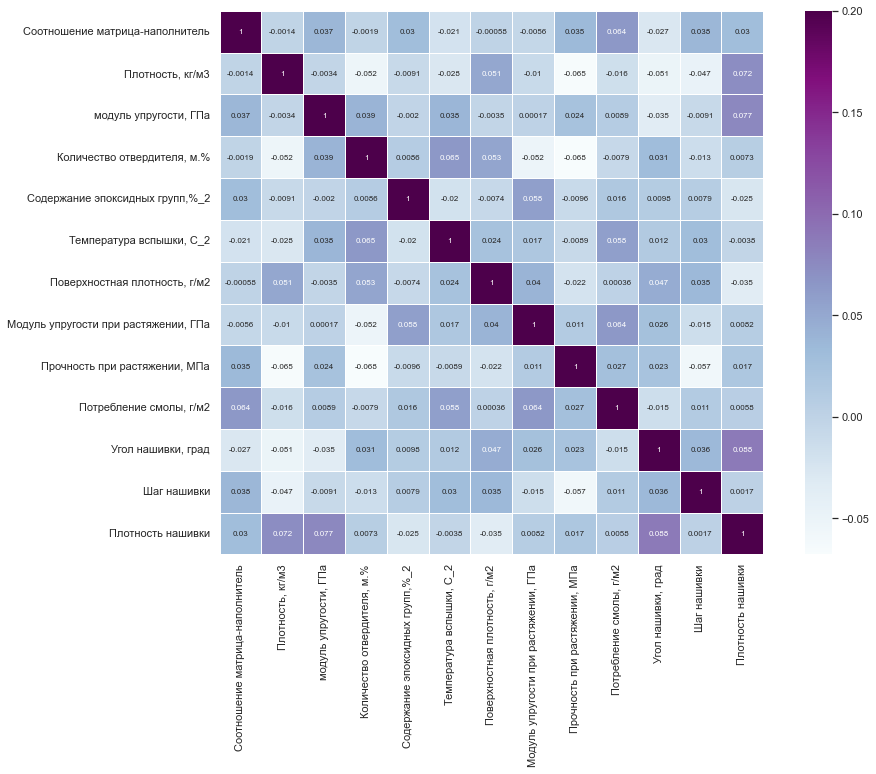

In [32]:
# отображаем тепловую карту попарной корреляция ненормализованного DataFrama после замены выбросов
f, ax = plt.subplots(figsize=(15,10))
sns.heatmap(data=df_bn_K2.corr(), vmax = 0.2, linewidths=0.5, cmap="BuPu",
            annot=True, square=True, fmt=".2g", annot_kws={"size": 8})

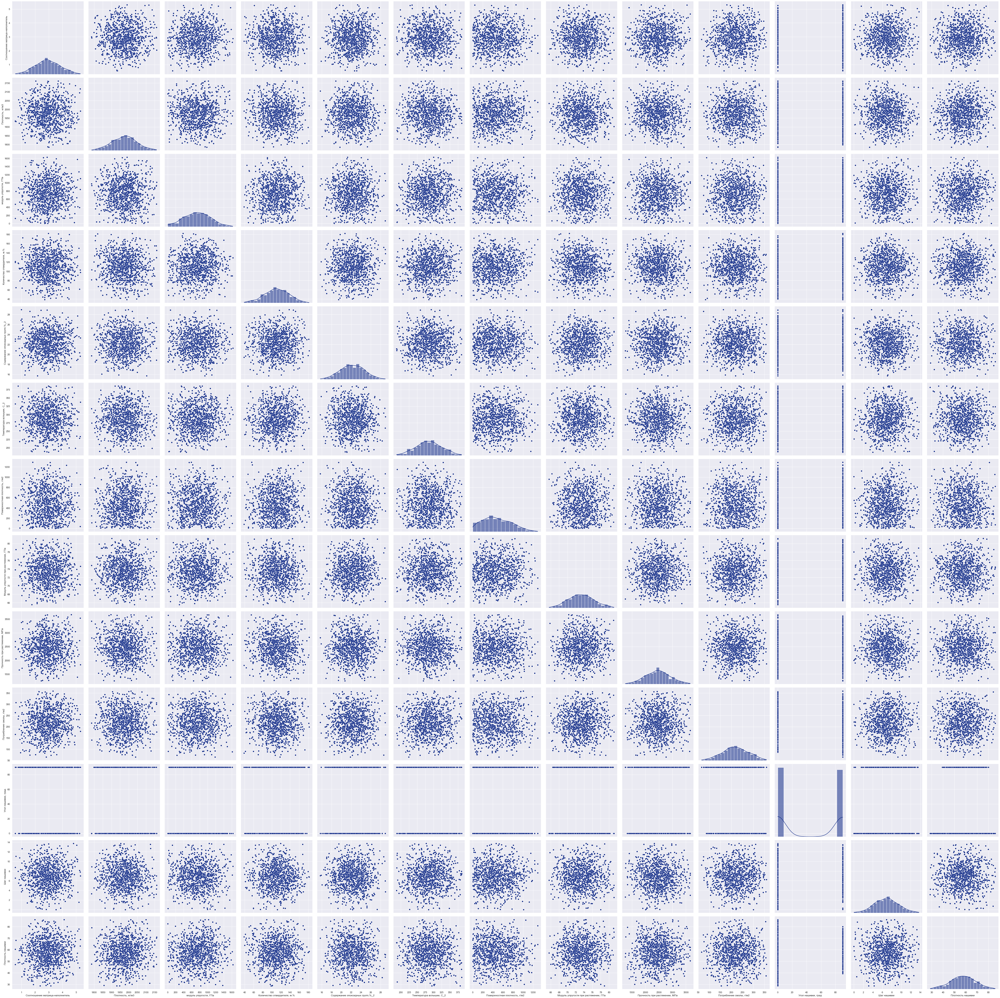

In [33]:
# построим попарные графики рассеяния на основании ненормализованного DataFrama после замены выбросов 
for i in df_bn_K2.columns:
    sns.set(palette="dark")

g = sns.PairGrid(df_bn_K2, diag_sharey=True, height=5)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.scatterplot);

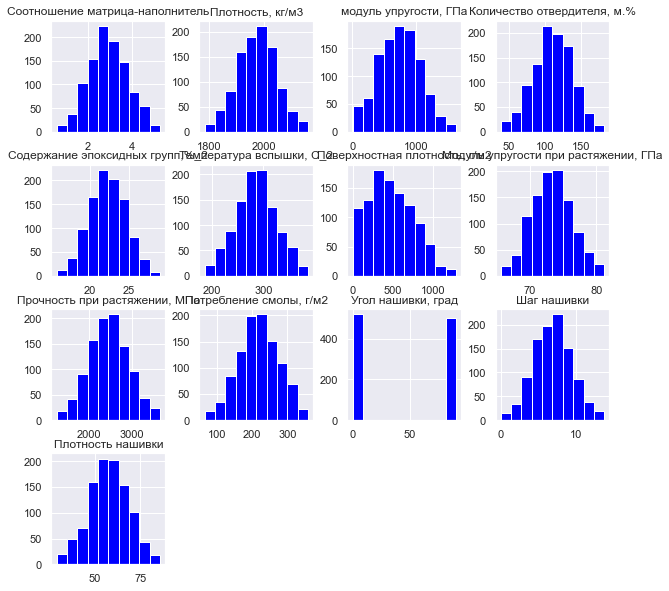

In [34]:
# построим сводную гистаграмму распределения по каждому параметру по ненормализованному DataFrame после замены выбросов
df_bn_K2.hist(figsize=(10,10), color = 'blue')
plt.show()    

## Раздел 2 Создание моделей и их обучение

# Модель LinearRegression

In [35]:
# с помощью метода INIT создадим класс Model и определим составляющие класса:
class Model:
    def __init__(self, name, method, parametrs):
        self.name = name
        self.parametrs = parametrs
        self.method = method

In [36]:
#  назовем наши модели
name_MU, name_PR = ['Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа']

In [37]:
# подгружаем модель линейной регрессии
from sklearn.linear_model import LinearRegression

Lreg = Model(
    name = 'LinearRegression',
    method = LinearRegression(),
    parametrs = None)

In [38]:
# определяем X и y, строим модель по нормализованному DataFrame для каждого целевого параметра
X1 = df_bn_n3.drop(['Модуль упругости при растяжении, ГПа'], axis = 1)
X2 = df_bn_n3.drop(['Прочность при растяжении, МПа'], axis = 1)
y1 = df_bn_n3['Модуль упругости при растяжении, ГПа']
y2 = df_bn_n3['Прочность при растяжении, МПа']

In [39]:
# Разбиваем датасет на обучающую и тестовую выборки
from sklearn.model_selection import train_test_split

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.3)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size = 0.3)

In [40]:
Lreg_MU = Lreg.method
Lreg_MU.fit(X1_train, y1_train)

LinearRegression()

In [41]:
Lreg_PR = Lreg.method
Lreg_PR.fit(X2_train, y2_train)

LinearRegression()

In [42]:
print(Lreg_MU.score(X1_test, y1_test))
print(Lreg_PR.score(X2_test, y2_test))

-0.02384273460721653
-0.0053152330628982725


In [43]:
scaler_MU = preprocessing.MinMaxScaler()
df_MU_n3 = scaler_MU.fit_transform(np.array(df_bn_K2['Модуль упругости при растяжении, ГПа']).reshape(-1,1))

In [44]:
scaler_PR = preprocessing.MinMaxScaler()
df_PR_n3 = scaler_PR.fit_transform(np.array(df_bn_K2['Прочность при растяжении, МПа']).reshape(-1,1))

In [45]:
# сформируем модель для рассчета метрик MAE, MSE, R2 и сохраним их в DataFrame для последующего сравнения 
def errors(model, X_train, X_test, y_train, y_test, name = 'Model name', trg = 'Целевой параметр', scaler = 'scaler?', score = True):
    mae_test = mean_absolute_error(y_test, model.predict(X_test))
    mae_train = mean_absolute_error(y_train, model.predict(X_train))
    mse_test = mean_squared_error(y_test, model.predict(X_test))
    mse_train = mean_squared_error(y_train, model.predict(X_train))
    
    df_errors = pd.DataFrame({
        'Модель':[name],
        'Целевой параметр':trg,
        'MAE(test)':mae_test,
        'MAE(train)':mae_train,
        'MSE(test)':mse_test,
        'MSE(train)':mse_train,
        'R2 score':model.score(X_test, y_test) 
    })
    return df_errors

In [46]:
# выведем метрики MAE, MSE и R2 в таблицу
df_errors_LrMU = errors(Lreg_MU, X1_train, X1_test, y1_train, y1_test, name = Lreg_MU, trg = name_MU, scaler = scaler_MU)
df_errors_LrPR = errors(Lreg_PR, X2_train, X2_test, y2_train, y2_test, name = Lreg_PR, trg = name_PR, scaler = scaler_PR)
df_errors_Lr = pd.concat([df_errors_LrMU, df_errors_LrPR], axis=0).reset_index(drop = True)
df_errors_Lr

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,LinearRegression(),"Модуль упругости при растяжении, ГПа",0.158885,0.157086,0.039905,0.037254,-0.023843
1,LinearRegression(),"Прочность при растяжении, МПа",0.164908,0.144731,0.040188,0.033970,-0.005315


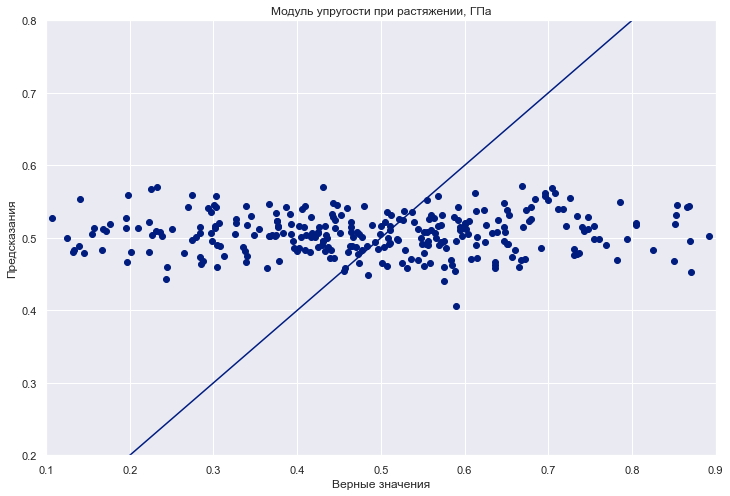

In [47]:
# создадим модель для визуализации в виде графика предсказанных и тестовых данных 
def plot_prediction(title, model, X_test, y_test, limx1 = 0, limx2 = 10, limy1 = 0, limy2 = 10):
    test_predictions = model.predict(X_test)

    a = plt.axes()
    plt.scatter(y_test, test_predictions)
    plt.xlabel('Верные значения')
    plt.ylabel('Предсказания')
    plt.title(title)
    plt.xlim([limx1, limx2])
    plt.ylim([limy1, limy2])
    _ = plt.plot([limx1, limx2], [limx1, limx2])
sns.set(
    palette='dark',
)
plt.figure(figsize=(12, 8))
plot_prediction(name_MU, Lreg_MU, X1_test, y1_test, 0.1, 0.9, 0.2, 0.8)

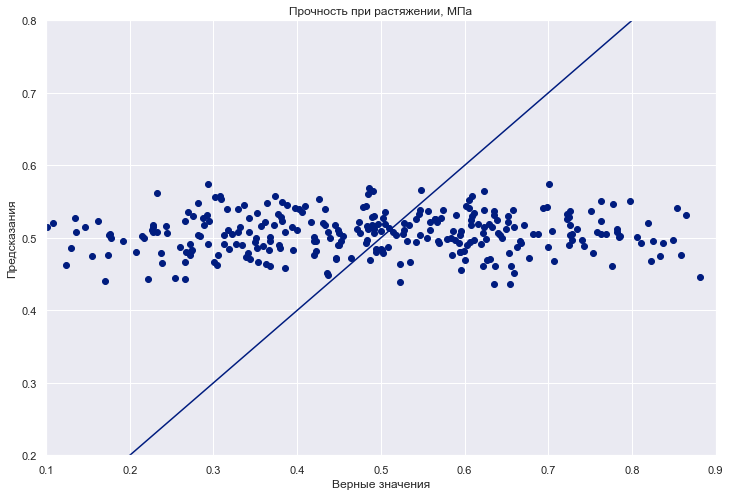

In [48]:
plt.figure(figsize=(12, 8))
plot_prediction(name_PR, Lreg_PR, X2_test, y2_test, 0.1, 0.9, 0.2, 0.8)

In [49]:
# создадим модель, которая будет выбирать новую тестовую выборку в заданном количестве и запишем все полученные данные в DataFrame, по каждому полученному результату рассчитаем метрики
def sample(count, model, X, y, test_size=0.3, scaler = 'scaler'):
    sample = []
    for _ in range(count):   
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
        model.fit(X_train, y_train)
        sample.append({'MAE':mean_absolute_error(y_test, model.predict(X_test)),'MSE':mean_squared_error(y_test, model.predict(X_test))})
    return pd.DataFrame(sample)

In [50]:
# зададим количество новых выборок 10
df_sample_lrMU = sample(10, Lreg_MU, X1, y1, scaler = scaler_MU)
df_sample_lrPR = sample(10, Lreg_PR, X2, y2, scaler = scaler_PR)

In [51]:
# выведим минимальные значения метрик для целевого параметра'Модуль упругости при растяжении, ГПа'
df_sample_lrMU.min()

MAE    0.149756
MSE    0.033741
dtype: float64

In [52]:
# выведим минимальные значения метрик для целевого параметра 'Прочность при растяжении, МПа'
df_sample_lrPR.min()

MAE    0.142563
MSE    0.031463
dtype: float64

## Модель RandomForestRegressor

In [53]:
from sklearn.ensemble import RandomForestRegressor

In [54]:
# определяем X и y, строим модель по нормализованному DataFrame для каждого целевого параметра

X1 = df_bn_n3.drop(['Модуль упругости при растяжении, ГПа'], axis = 1)
X2 = df_bn_n3.drop(['Прочность при растяжении, МПа'], axis = 1)
y1 = df_bn_n3['Модуль упругости при растяжении, ГПа']
y2 = df_bn_n3['Прочность при растяжении, МПа']

# строим модель случайный лес
RFReg = Model(
    name = 'RandomForestRegressor',
    method = RandomForestRegressor(),
    parametrs = {
   'n_estimators': [100, 200, 500],
   'max_features': ['auto', 'sqrt', 'log2'],
   'max_depth' : [4,8,12],
   'criterion' : ['mse']  
   })    


In [55]:
# Разбиваем датасет на обучающую и тестовую выборки
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.3)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size = 0.3)

In [56]:
# создаем модель с поиском гиперпараметров с перекрестной проверкой, количество блоков 10  
def model_hyper(model, parametrs, X_train, X_test, y_train, y_test, scl = 'scaler?', cv=10, verbose=2):
    GSCV = GridSearchCV(estimator=model, param_grid=parametrs, cv=cv, verbose=verbose)
    GSCV.fit(X_train, y_train)
    model = GSCV.best_estimator_
    param = GSCV.best_params_
    model.fit(X_train, y_train)
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)
# устанавливаем метрики mae, mse и R2
    mae_train = mean_absolute_error(y_train, train_pred)
    mae_test = mean_absolute_error(y_test, test_pred)
    mse_train = mean_squared_error(y_train, train_pred)
    mse_test = mean_squared_error(y_test, test_pred)
    scaler = scaler_MU if 'Модуль упругости при растяжении' in y_test.name else scaler_PR if 'Прочность при растяжении' in y_train.name else scl
    model_hyper = {'model':model, 'best_Parametrs': param,'MAE[train]':mae_train,'MAE[test]':mae_test,'MSE[train]':mse_train,'MSE[test]':mse_test, 
                'R2Score': model.score(X_test, y_test)}
    
    return model_hyper
   

In [57]:
RFReg_MU = model_hyper(RFReg.method, RFReg.parametrs, X1_train, X1_test, y1_train, y1_test)

Fitting 10 folds for each of 27 candidates, totalling 270 fits
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] EN

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=500; total time=   0.7s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=500; total time=   0.7s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=1

[CV] END criterion=mse, max_depth=8, max_features=log2, n_estimators=500; total time=   1.3s
[CV] END criterion=mse, max_depth=8, max_features=log2, n_estimators=500; total time=   1.1s
[CV] END criterion=mse, max_depth=8, max_features=log2, n_estimators=500; total time=   1.6s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.5s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.5s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.5s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.5s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_esti

[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.4s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.4s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.2s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.0s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.1s


In [58]:
RFReg_MU

{'model': RandomForestRegressor(max_depth=4, max_features='log2', n_estimators=500),
 'best_Parametrs': {'criterion': 'mse',
  'max_depth': 4,
  'max_features': 'log2',
  'n_estimators': 500},
 'MAE[train]': 0.15091716252905835,
 'MAE[test]': 0.1429644646444967,
 'MSE[train]': 0.03451503523455464,
 'MSE[test]': 0.032412221354739916,
 'R2Score': -0.009569384403520953}

In [59]:
RFReg_PR = model_hyper(RFReg.method, RFReg.parametrs, X2_train, X2_test, y2_train, y2_test)

Fitting 10 folds for each of 27 candidates, totalling 270 fits
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=100; total time=   0.2s
[CV] EN

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=500; total time=   1.5s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=500; total time=   0.9s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.5s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.3s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=8, max_features=auto, n_estimators=1

[CV] END criterion=mse, max_depth=8, max_features=log2, n_estimators=500; total time=   0.8s
[CV] END criterion=mse, max_depth=8, max_features=log2, n_estimators=500; total time=   0.8s
[CV] END criterion=mse, max_depth=8, max_features=log2, n_estimators=500; total time=   0.9s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_estimators=100; total time=   0.4s
[CV] END criterion=mse, max_depth=12, max_features=auto, n_esti

[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.0s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.0s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.0s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.1s
[CV] END criterion=mse, max_depth=12, max_features=log2, n_estimators=500; total time=   1.2s


In [63]:
RFReg_PR

{'model': RandomForestRegressor(max_depth=4, max_features='log2', n_estimators=500),
 'best_Parametrs': {'criterion': 'mse',
  'max_depth': 4,
  'max_features': 'log2',
  'n_estimators': 500},
 'MAE[train]': 0.13973590361387667,
 'MAE[test]': 0.15645786804858883,
 'MSE[train]': 0.030657310856094952,
 'MSE[test]': 0.037846468255617466,
 'R2Score': 0.019791439520827736}

In [64]:
def err_hyper(model,trg = 'trg?', name = None):
    df = pd.DataFrame({
        'Модель':[model['model']] if name == None else [name],
        'Целевой параметр':'Модуль упругости при растяжении, ГПа' if trg == 'MU' else 'Прочность при растяжении, МПа' if trg == 'PR' else trg,
        'MAE(test)':model['MAE[test]'],
        'MAE(train)':model['MAE[train]'],
        'MSE(test)':model['MSE[test]'],
        'MSE(train)':model['MSE[train]'],
        'R2 score':model['R2Score']
    })
    return df

In [65]:
err_hyper(RFReg_MU, 'MU')

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,"(DecisionTreeRegressor(max_depth=4, max_featur...","Модуль упругости при растяжении, ГПа",0.142964,0.150917,0.032412,0.034515,-0.009569


In [66]:
err_hyper(RFReg_PR, 'PR')

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,"(DecisionTreeRegressor(max_depth=4, max_featur...","Прочность при растяжении, МПа",0.156458,0.139736,0.037846,0.030657,0.019791


In [67]:
df_errors_Rfreg = pd.concat([err_hyper(RFReg_MU, 'MU', name = 'RandomForest()'), err_hyper(RFReg_PR, 'PR', name = 'RandomForest()')], axis=0).reset_index(drop = True)
df_errors_Rfreg

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,RandomForest(),"Модуль упругости при растяжении, ГПа",0.142964,0.150917,0.032412,0.034515,-0.009569
1,RandomForest(),"Прочность при растяжении, МПа",0.156458,0.139736,0.037846,0.030657,0.019791


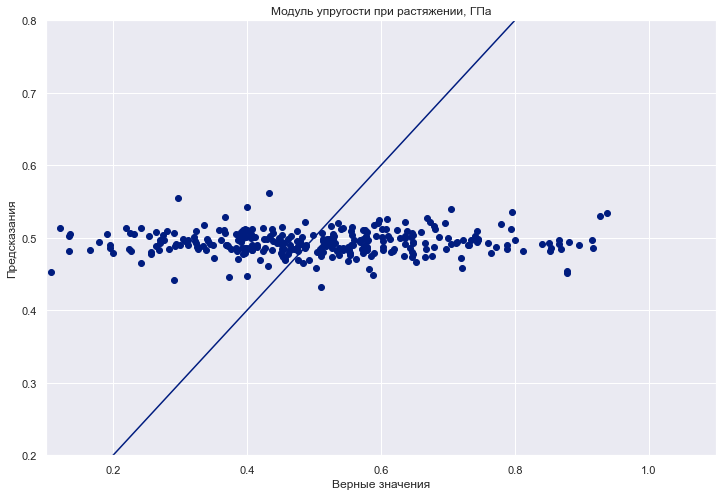

In [68]:
plt.figure(figsize=(12, 8))
plot_prediction(name_MU, RFReg_MU['model'], X1_test, y1_test, 0.1, 1.1, 0.2, 0.8)

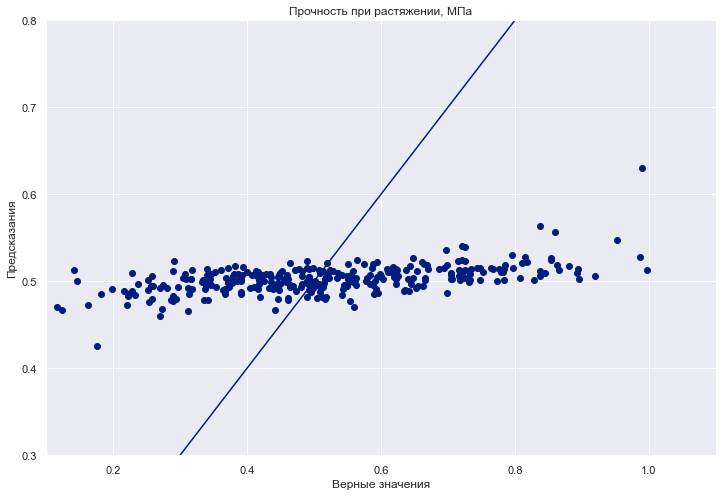

In [215]:
plt.figure(figsize=(12, 8))
plot_prediction(name_PR, RFReg_PR['model'], X2_test, y2_test, 0.1, 1.1, 0.3, 0.8)

## Модель KNeighborsRegressor

In [70]:
from sklearn.neighbors import KNeighborsRegressor
KBS = Model(
    name = 'KNeighbors',
    method = KNeighborsRegressor(),
    parametrs = {
   'n_neighbors': [10, 50, 100, 200]
    })

In [71]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3)

In [72]:
KBS_MU = model_hyper(KBS.method, KBS.parametrs, X1_train, X1_test, y1_train, y1_test, cv = 50)

Fitting 50 folds for each of 4 candidates, totalling 200 fits
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n

[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ...................

In [73]:
KBS_MU

{'model': KNeighborsRegressor(n_neighbors=50),
 'best_Parametrs': {'n_neighbors': 50},
 'MAE[train]': 0.15434768621817146,
 'MAE[test]': 0.15807209554627238,
 'MSE[train]': 0.03574775840165867,
 'MSE[test]': 0.039357254431290886,
 'R2Score': -0.05987968758407858}

In [74]:
err_hyper(KBS_MU, 'MU')

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,KNeighborsRegressor(n_neighbors=50),"Модуль упругости при растяжении, ГПа",0.158072,0.154348,0.039357,0.035748,-0.05988


In [75]:
KBS_PR = model_hyper(KBS.method, KBS.parametrs, X2_train, X2_test, y2_train, y2_test, cv = 50)

Fitting 50 folds for each of 4 candidates, totalling 200 fits
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n_neighbors=10; total time=   0.0s
[CV] END .....................................n

[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ....................................n_neighbors=100; total time=   0.0s
[CV] END ...................

In [76]:
KBS_PR

{'model': KNeighborsRegressor(n_neighbors=50),
 'best_Parametrs': {'n_neighbors': 50},
 'MAE[train]': 0.1478797260414261,
 'MAE[test]': 0.15342278192965467,
 'MSE[train]': 0.03476463446666064,
 'MSE[test]': 0.03672174424567485,
 'R2Score': -0.028126225830012785}

In [77]:
err_hyper(KBS_PR, 'PR')

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,KNeighborsRegressor(n_neighbors=50),"Прочность при растяжении, МПа",0.153423,0.14788,0.036722,0.034765,-0.028126


In [78]:
df_errors_KBS = pd.concat([err_hyper(KBS_MU, 'MU', name = 'KNeighbors()'), err_hyper(KBS_PR, 'PR', name = 'KNeighbors()')], axis=0).reset_index(drop = True)
df_errors_KBS

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,KNeighbors(),"Модуль упругости при растяжении, ГПа",0.158072,0.154348,0.039357,0.035748,-0.059880
1,KNeighbors(),"Прочность при растяжении, МПа",0.153423,0.147880,0.036722,0.034765,-0.028126


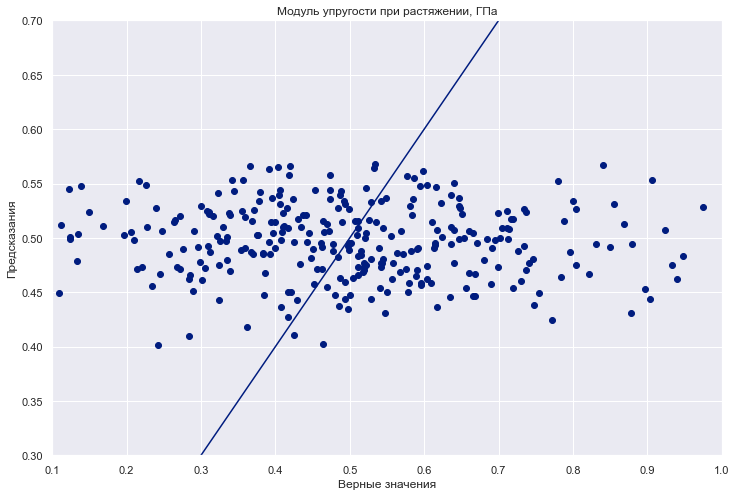

In [79]:
plt.figure(figsize=(12, 8))
plot_prediction(name_MU, KBS_MU['model'], X1_test, y1_test, 0.1, 1.0, 0.3, 0.7)

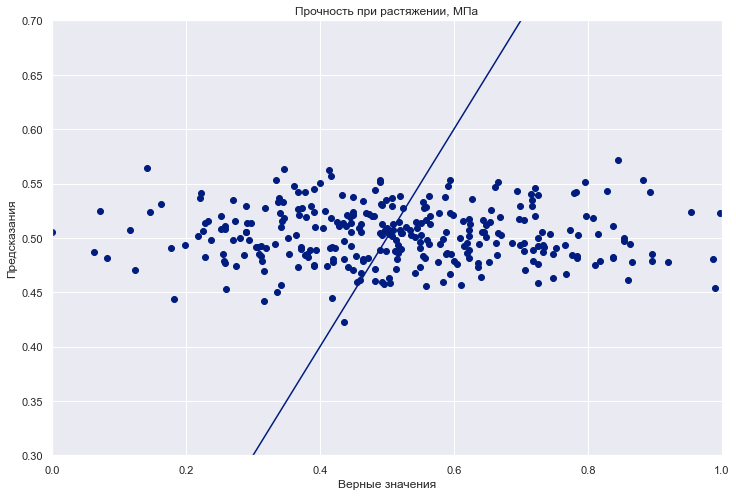

In [80]:
plt.figure(figsize=(12, 8))
plot_prediction(name_PR, KBS_PR['model'], X2_test, y2_test, 0.0, 1.0, 0.3, 0.7)

In [81]:
df_errors_svod = pd.concat([df_errors_Lr, df_errors_Rfreg, df_errors_KBS], axis=0).reset_index(drop = True)
df_errors_svod

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train),R2 score
0,LinearRegression(),"Модуль упругости при растяжении, ГПа",0.158885,0.157086,0.039905,0.037254,-0.023843
1,LinearRegression(),"Прочность при растяжении, МПа",0.164908,0.144731,0.040188,0.033970,-0.005315
2,RandomForest(),"Модуль упругости при растяжении, ГПа",0.142964,0.150917,0.032412,0.034515,-0.009569
3,RandomForest(),"Прочность при растяжении, МПа",0.156458,0.139736,0.037846,0.030657,0.019791
4,KNeighbors(),"Модуль упругости при растяжении, ГПа",0.158072,0.154348,0.039357,0.035748,-0.059880
5,KNeighbors(),"Прочность при растяжении, МПа",0.153423,0.147880,0.036722,0.034765,-0.028126


In [217]:
RFMU = RFReg_MU['model']
KNPR = KBS_PR['model']

In [220]:
import pickle

pickle.dump(RFMU, open('RFMU_pkl','wb'))
pickle.dump(KNPR, open('KNPR_pkl','wb'))

## Построение нейронной сети

In [84]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

print(keras.__version__)

2.8.0


In [85]:
# построение нейронной сети будем осуществлять на ненормализованном DataFrame
X = df_bn_K2.drop(['Соотношение матрица-наполнитель'], axis = 1)
# Целевая переменная:
y = df_bn_K2['Соотношение матрица-наполнитель']

In [86]:
#  назовем нашу модель
name_SMN = ['Соотношение матрица-наполнитель']

In [87]:
from sklearn.model_selection import train_test_split

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.3, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.3, random_state=1)

In [88]:
normalizer = tf.keras.layers.Normalization(axis=-1)

In [89]:
normalizer.adapt(np.array(X))

In [90]:
print(normalizer.mean.numpy())

[[1974.7767     736.99866    110.42243     22.24048    286.03653
   481.0161      73.30509   2459.8025     218.3444      44.252197
     6.8691354   57.526363 ]]


In [91]:
with np.printoptions(precision=3):
    print(normalizer(X).numpy())

[[ 0.78   0.005 -0.943 ... -0.984 -1.137 -0.048]
 [ 0.78   0.005 -2.259 ... -0.984 -1.137  0.224]
 [ 0.78   0.005 -2.263 ... -0.984 -1.137  1.131]
 ...
 [-0.034 -0.984  0.004 ...  1.017 -1.073  0.916]
 [ 1.299  0.014  1.158 ...  1.017 -0.22   0.067]
 [-1.191 -0.983  0.701 ...  1.017 -0.313  1.805]]


In [92]:
# Построим простую линейную модель 1
SMNlin_model1 = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])
SMNlin_model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense (Dense)               (None, 1)                 13        
                                                                 
Total params: 38
Trainable params: 13
Non-trainable params: 25
_________________________________________________________________


In [93]:
SMNlin_model1.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_squared_error')

In [94]:
%%time
history = SMNlin_model1.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=1,
    validation_data=(X_val, y_val))

Epoch 1/1023
16/16 [==============================] - 1s 13ms/step - loss: 6.6292 - val_loss: 3.3479
Epoch 2/1023
16/16 [==============================] - 0s 5ms/step - loss: 1.7213 - val_loss: 1.0057
Epoch 3/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8393 - val_loss: 0.8881
Epoch 4/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8115 - val_loss: 0.9043
Epoch 5/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.7890 - val_loss: 0.8494
Epoch 6/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.7988 - val_loss: 0.8862
Epoch 7/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8198 - val_loss: 0.8932
Epoch 8/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8076 - val_loss: 0.8811
Epoch 9/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.7990 - val_loss: 0.8804
Epoch 10/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8004 - val_loss: 0.879

16/16 [==============================] - 0s 4ms/step - loss: 0.8458 - val_loss: 0.9293
Epoch 163/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8699 - val_loss: 0.9770
Epoch 164/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8102 - val_loss: 0.9020
Epoch 165/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8599 - val_loss: 0.9834
Epoch 166/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8732 - val_loss: 0.9139
Epoch 167/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8430 - val_loss: 0.9543
Epoch 168/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8189 - val_loss: 0.8471
Epoch 169/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8430 - val_loss: 0.9539
Epoch 170/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8306 - val_loss: 0.8778
Epoch 171/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8346 - val_loss: 0.

16/16 [==============================] - 0s 5ms/step - loss: 0.8849 - val_loss: 0.9375
Epoch 323/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8388 - val_loss: 0.8891
Epoch 324/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8706 - val_loss: 0.9046
Epoch 325/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8719 - val_loss: 0.9242
Epoch 326/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8712 - val_loss: 0.9856
Epoch 327/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8675 - val_loss: 0.9752
Epoch 328/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8591 - val_loss: 0.8875
Epoch 329/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8547 - val_loss: 0.9360
Epoch 330/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.9156 - val_loss: 0.9675
Epoch 331/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8296 - val_loss: 0.

16/16 [==============================] - 0s 5ms/step - loss: 0.8680 - val_loss: 0.9384
Epoch 483/1023
16/16 [==============================] - 0s 7ms/step - loss: 0.8575 - val_loss: 0.8863
Epoch 484/1023
16/16 [==============================] - 0s 7ms/step - loss: 0.8665 - val_loss: 0.9445
Epoch 485/1023
16/16 [==============================] - 0s 7ms/step - loss: 0.8651 - val_loss: 0.9387
Epoch 486/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8666 - val_loss: 0.9273
Epoch 487/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8299 - val_loss: 0.9248
Epoch 488/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8320 - val_loss: 0.9340
Epoch 489/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8648 - val_loss: 0.8932
Epoch 490/1023
16/16 [==============================] - 0s 7ms/step - loss: 0.8332 - val_loss: 1.0084
Epoch 491/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8380 - val_loss: 0.

16/16 [==============================] - 0s 6ms/step - loss: 0.8388 - val_loss: 0.8829
Epoch 643/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8282 - val_loss: 0.8925
Epoch 644/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8744 - val_loss: 0.8906
Epoch 645/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8306 - val_loss: 0.8935
Epoch 646/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8354 - val_loss: 0.9613
Epoch 647/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8491 - val_loss: 0.9119
Epoch 648/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.7989 - val_loss: 0.8841
Epoch 649/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8701 - val_loss: 0.9748
Epoch 650/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8524 - val_loss: 0.9084
Epoch 651/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8643 - val_loss: 0.

16/16 [==============================] - 0s 4ms/step - loss: 0.8398 - val_loss: 0.9017
Epoch 803/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8541 - val_loss: 0.8860
Epoch 804/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8668 - val_loss: 0.9752
Epoch 805/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8635 - val_loss: 0.9307
Epoch 806/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8303 - val_loss: 0.9420
Epoch 807/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8071 - val_loss: 0.8798
Epoch 808/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8509 - val_loss: 0.8950
Epoch 809/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.8450 - val_loss: 0.9205
Epoch 810/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8539 - val_loss: 0.8637
Epoch 811/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8563 - val_loss: 0.

16/16 [==============================] - 0s 7ms/step - loss: 0.8587 - val_loss: 0.8596
Epoch 963/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8728 - val_loss: 0.9438
Epoch 964/1023
16/16 [==============================] - 0s 7ms/step - loss: 0.8325 - val_loss: 0.8962
Epoch 965/1023
16/16 [==============================] - 0s 7ms/step - loss: 0.8117 - val_loss: 0.9477
Epoch 966/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8373 - val_loss: 0.8800
Epoch 967/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8520 - val_loss: 0.9262
Epoch 968/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8161 - val_loss: 0.9289
Epoch 969/1023
16/16 [==============================] - 0s 6ms/step - loss: 0.8369 - val_loss: 0.9097
Epoch 970/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8287 - val_loss: 0.9067
Epoch 971/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8372 - val_loss: 0.

In [95]:
history.history

{'loss': [6.629234790802002,
  1.721339464187622,
  0.8393117785453796,
  0.8115299344062805,
  0.7890336513519287,
  0.7988108992576599,
  0.8198480606079102,
  0.8075973391532898,
  0.7990232706069946,
  0.8004173040390015,
  0.8087452054023743,
  0.8334271907806396,
  0.8082507252693176,
  0.8229958415031433,
  0.8072078227996826,
  0.7992979884147644,
  0.8288889527320862,
  0.8232249617576599,
  0.8245870471000671,
  0.8020474314689636,
  0.8230951428413391,
  0.8545538783073425,
  0.8509362936019897,
  0.8648545742034912,
  0.8500802516937256,
  0.8181931376457214,
  0.8171390891075134,
  0.8361914157867432,
  0.8440855145454407,
  0.8215815424919128,
  0.8280947208404541,
  0.817587673664093,
  0.820907711982727,
  0.8286507725715637,
  0.8051247596740723,
  0.8487488627433777,
  0.8450652956962585,
  0.8342042565345764,
  0.8530346751213074,
  0.8484928011894226,
  0.849240779876709,
  0.8291443586349487,
  0.8274208307266235,
  0.7932627201080322,
  0.8580389022827148,
  0.868

In [96]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
1018,0.819646,0.870740,1018
1019,0.834373,0.932385,1019
1020,0.870691,0.915892,1020
1021,0.825967,0.933404,1021
1022,0.837705,0.913857,1022


In [97]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)

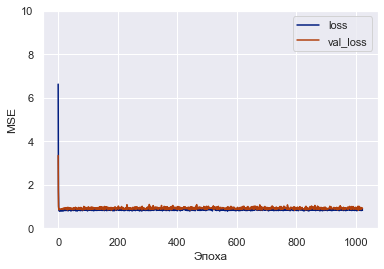

In [98]:
plot_loss(history)

In [99]:
test_results = {}
test_results['SMNlin_model1'] = SMNlin_model1.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNlin_model1': 0.8928490877151489}

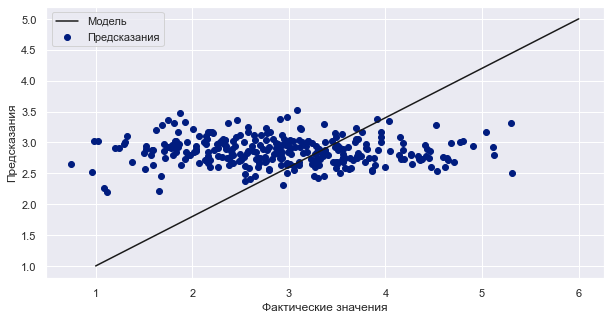

In [100]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNlin_model1.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [101]:
def errorsns (model, X_train, X_test, y_train, y_test, name = 'Model name', trg = 'Целевой параметр'):
    mae_test = mean_absolute_error(y_test, model.predict(X_test))
    mse_test = mean_squared_error(y_test, model.predict(X_test))
    mae_train = mean_absolute_error(y_train, model.predict(X_train))
    mse_train = mean_squared_error(y_train, model.predict(X_train))
        
    df_errorsns = pd.DataFrame({
        'Модель':[name],
        'Целевой параметр':trg,
        'MAE(test)':mae_test,
        'MAE(train)':mae_train,
        'MSE(test)':mse_test,
        'MSE(train)':mse_train,
})
    return df_errorsns

In [102]:
df_SMNlen1 = errorsns(SMNlin_model1, X_train, X_test, y_train, y_test,
       name = 'SMNlin_model1', trg = 'Соотношение матрица-наполнитель')
df_SMNlen1

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNlin_model1,Соотношение матрица-наполнитель,0.768106,0.700065,0.892849,0.777362


In [103]:
# вводим функцию CALLBACKS(остаовка обучения когда  целевой показатель перестает улучшаться) 
callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, 
                                                     verbose=1, restore_best_weights=True)
def callbacks(pat = 10):
    callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=pat, 
                                                     verbose=1, restore_best_weights=True)
    return callback

In [104]:
# Построим простую линейную модель с теми же параметрами, но включим функцию callbacks
SMNlin_model2 = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])
SMNlin_model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_1 (Dense)             (None, 1)                 13        
                                                                 
Total params: 38
Trainable params: 13
Non-trainable params: 25
_________________________________________________________________


In [105]:
SMNlin_model2.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_squared_error')

In [106]:
%%time
history = SMNlin_model2.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val)
)

Restoring model weights from the end of the best epoch: 11.
Epoch 21: early stopping
Wall time: 1.36 s


In [107]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)

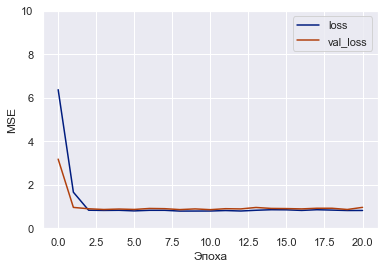

In [108]:
plot_loss(history)

In [109]:
test_results = {}
test_results['SMNlin_model2'] = SMNlin_model2.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNlin_model2': 0.8506399393081665}

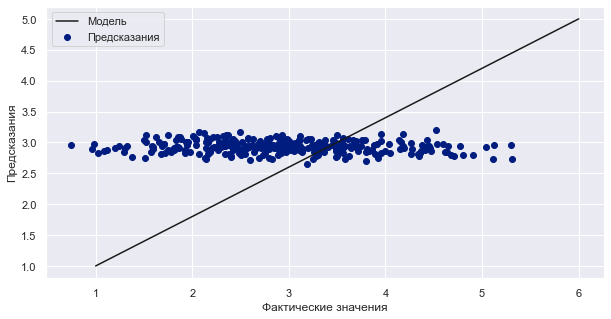

In [110]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNlin_model2.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [111]:
df_SMNlen2 = errorsns(SMNlin_model2, X_train, X_test, y_train, y_test,
       name = 'SMNlin_model2', trg = 'Соотношение матрица-наполнитель')
df_SMNlen2

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNlin_model2,Соотношение матрица-наполнитель,0.743408,0.702235,0.85064,0.766792


In [112]:
# Построим простую линейную модель с теми же параметрами, но изменим оптимизатор на SGD
SMNlin_model3 = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])
SMNlin_model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_2 (Dense)             (None, 1)                 13        
                                                                 
Total params: 38
Trainable params: 13
Non-trainable params: 25
_________________________________________________________________


In [113]:
SMNlin_model3.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.1),
    loss='mean_squared_error')

In [114]:
%%time
history = SMNlin_model3.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 3.
Epoch 13: early stopping
Wall time: 951 ms


In [115]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)

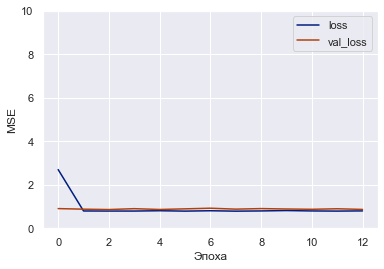

In [116]:
plot_loss(history)

In [117]:
test_results = {}
test_results['SMNlin_model3'] = SMNlin_model3.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNlin_model3': 0.819654643535614}

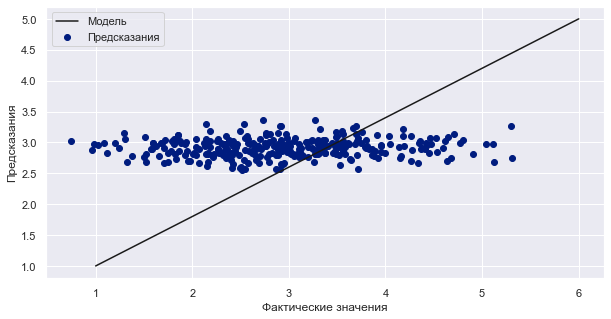

In [118]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNlin_model3.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [119]:
df_SMNlen3 = errorsns(SMNlin_model3, X_train, X_test, y_train, y_test,
       name = 'SMNlin_model3', trg = 'Соотношение матрица-наполнитель')
df_SMNlen3

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNlin_model3,Соотношение матрица-наполнитель,0.726577,0.711425,0.819655,0.780347


In [120]:
# Построим простую линейную модель с теми же параметрами, но изменим оптимизатор на RMSprop
SMNlin_model4 = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])
SMNlin_model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_3 (Dense)             (None, 1)                 13        
                                                                 
Total params: 38
Trainable params: 13
Non-trainable params: 25
_________________________________________________________________


In [121]:
SMNlin_model4.compile(
    optimizer=keras.optimizers.RMSprop(learning_rate=0.01),
    loss='mean_squared_error')

In [122]:
%%time
history = SMNlin_model4.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 44.
Epoch 54: early stopping
Wall time: 2.77 s


In [123]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)

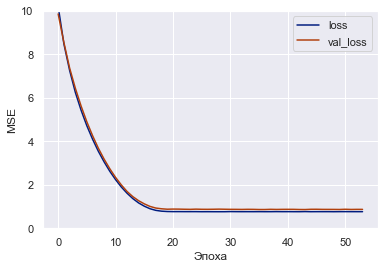

In [124]:
plot_loss(history)

In [125]:
test_results = {}
test_results['SMNlin_model4'] = SMNlin_model4.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNlin_model4': 0.8317900896072388}

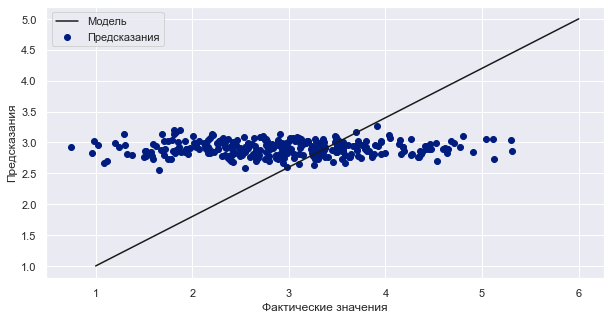

In [126]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNlin_model4.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [127]:
df_SMNlen4 = errorsns(SMNlin_model4, X_train, X_test, y_train, y_test,
       name = 'SMNlin_model4', trg = 'Соотношение матрица-наполнитель')
df_SMNlen4

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNlin_model4,Соотношение матрица-наполнитель,0.7365,0.687957,0.83179,0.749356


In [128]:
df_SMN_svod = pd.concat([df_SMNlen1, df_SMNlen2, df_SMNlen3, df_SMNlen4], axis=0).reset_index(drop = True)
df_SMN_svod

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNlin_model1,Соотношение матрица-наполнитель,0.768106,0.700065,0.892849,0.777362
1,SMNlin_model2,Соотношение матрица-наполнитель,0.743408,0.702235,0.850640,0.766792
2,SMNlin_model3,Соотношение матрица-наполнитель,0.726577,0.711425,0.819655,0.780347
3,SMNlin_model4,Соотношение матрица-наполнитель,0.736500,0.687957,0.831790,0.749356


## Построение многослойного персетрона

In [129]:
#
def build_and_compile_model(normalizer):
    model1 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
    ])

    model1.compile(optimizer=tf.keras.optimizers.Adam(0.001),
                loss='mean_squared_error')
    return model1

In [130]:
SMNmp_264_adam = build_and_compile_model(normalizer)
SMNmp_264_adam.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_4 (Dense)             (None, 64)                832       
                                                                 
 dense_5 (Dense)             (None, 64)                4160      
                                                                 
 dense_6 (Dense)             (None, 1)                 65        
                                                                 
Total params: 5,082
Trainable params: 5,057
Non-trainable params: 25
_________________________________________________________________


In [131]:
%%time
history = SMNmp_264_adam.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=1,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Epoch 1/1023
16/16 [==============================] - 3s 15ms/step - loss: 7.9292 - val_loss: 4.6710
Epoch 2/1023
16/16 [==============================] - 0s 6ms/step - loss: 2.5822 - val_loss: 1.6246
Epoch 3/1023
16/16 [==============================] - 0s 5ms/step - loss: 1.2573 - val_loss: 1.3980
Epoch 4/1023
16/16 [==============================] - 0s 5ms/step - loss: 1.1071 - val_loss: 1.2971
Epoch 5/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.9942 - val_loss: 1.2875
Epoch 6/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.9480 - val_loss: 1.2606
Epoch 7/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.9187 - val_loss: 1.2527
Epoch 8/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8919 - val_loss: 1.2399
Epoch 9/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8669 - val_loss: 1.2329
Epoch 10/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8426 - val_loss: 1.222

In [132]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)

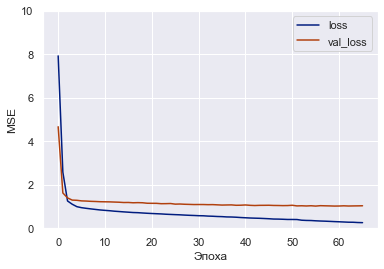

In [133]:
plot_loss(history)

In [134]:
test_results = {}
test_results['SMNmp_264_adam'] = SMNmp_264_adam.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_264_adam': 1.0329216718673706}

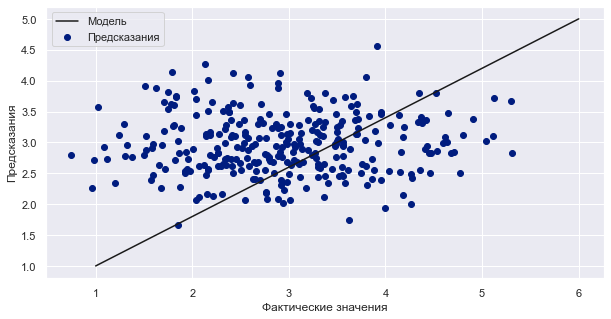

In [135]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_264_adam.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [136]:
df_SMNmp1 = errorsns(SMNmp_264_adam, X_train, X_test, y_train, y_test,
       name = 'SMNmp_264_adam', trg = 'Соотношение матрица-наполнитель')
df_SMNmp1

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_264_adam,Соотношение матрица-наполнитель,0.810042,0.458006,1.032922,0.327554


In [137]:
def build_and_compile_model(normalizer):
    model2 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),  
      layers.Dense(1)
    ])

    model2.compile(optimizer=tf.keras.optimizers.Adam(0.001),
                loss='mean_squared_error')
    return model2

In [138]:
SMNmp_364_adam = build_and_compile_model(normalizer)
SMNmp_364_adam.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_7 (Dense)             (None, 64)                832       
                                                                 
 dense_8 (Dense)             (None, 64)                4160      
                                                                 
 dense_9 (Dense)             (None, 64)                4160      
                                                                 
 dense_10 (Dense)            (None, 1)                 65        
                                                                 
Total params: 9,242
Trainable params: 9,217
Non-trainable params: 25
___________________________________________________

In [139]:
%%time
history = SMNmp_364_adam.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=1,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Epoch 1/1023
16/16 [==============================] - 1s 13ms/step - loss: 6.5913 - val_loss: 3.4633
Epoch 2/1023
16/16 [==============================] - 0s 5ms/step - loss: 1.8317 - val_loss: 1.5997
Epoch 3/1023
16/16 [==============================] - 0s 4ms/step - loss: 1.1743 - val_loss: 1.3022
Epoch 4/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.9559 - val_loss: 1.2479
Epoch 5/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8941 - val_loss: 1.2427
Epoch 6/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8545 - val_loss: 1.2155
Epoch 7/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.8142 - val_loss: 1.2101
Epoch 8/1023
16/16 [==============================] - 0s 4ms/step - loss: 0.7860 - val_loss: 1.2138
Epoch 9/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.7624 - val_loss: 1.1968
Epoch 10/1023
16/16 [==============================] - 0s 5ms/step - loss: 0.7295 - val_loss: 1.193

In [140]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)

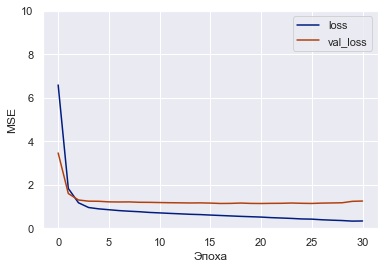

In [141]:
plot_loss(history)

In [142]:
test_results = {}
test_results['SMNmp_364_adam'] = SMNmp_364_adam.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_364_adam': 1.0381053686141968}

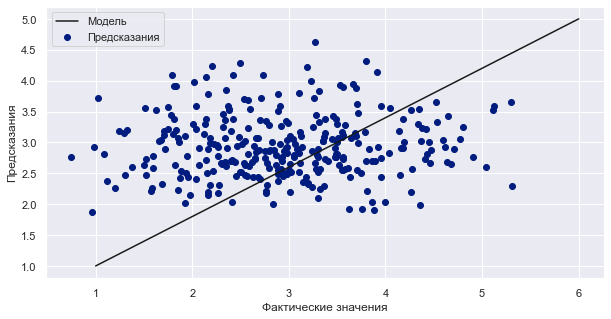

In [143]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_364_adam.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [144]:
df_SMNmp2 = errorsns(SMNmp_364_adam, X_train, X_test, y_train, y_test,
       name = 'SMNmp_364_adam', trg = 'Соотношение матрица-наполнитель')
df_SMNmp2

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_364_adam,Соотношение матрица-наполнитель,0.814787,0.56344,1.038105,0.485206


In [145]:
def build_and_compile_model(normalizer):
    model3 = keras.Sequential([
      normalizer,
      layers.Dense(128, activation='relu'),
      layers.Dense(128, activation='relu'),
      layers.Dense(128, activation='relu'),  
      layers.Dense(1)
    ])

    model3.compile(optimizer=tf.keras.optimizers.Adam(0.001),
                loss='mean_squared_error')
    return model3

In [146]:
SMNmp_3128_adam = build_and_compile_model(normalizer)
SMNmp_3128_adam.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_11 (Dense)            (None, 128)               1664      
                                                                 
 dense_12 (Dense)            (None, 128)               16512     
                                                                 
 dense_13 (Dense)            (None, 128)               16512     
                                                                 
 dense_14 (Dense)            (None, 1)                 129       
                                                                 
Total params: 34,842
Trainable params: 34,817
Non-trainable params: 25
_________________________________________________

In [147]:
%%time
history = SMNmp_3128_adam.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 19.
Epoch 29: early stopping
Wall time: 2.17 s


In [148]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)  

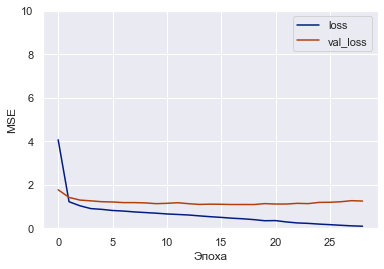

In [149]:
  plot_loss(history)

In [150]:
test_results = {}
test_results['SMNmp_3128_adam'] = SMNmp_3128_adam.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_3128_adam': 1.1212725639343262}

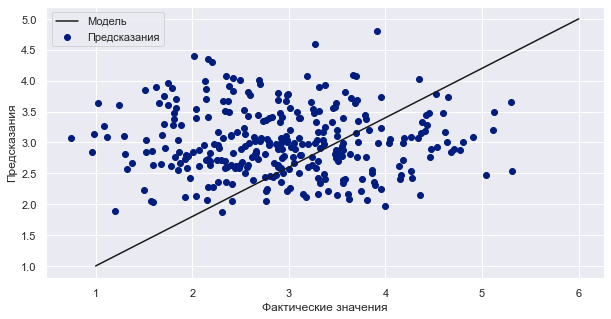

In [151]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_3128_adam.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [152]:
df_SMNmp3 = errorsns(SMNmp_3128_adam, X_train, X_test, y_train, y_test,
       name = 'SMNmp_3128_adam', trg = 'Соотношение матрица-наполнитель')
df_SMNmp3

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_3128_adam,Соотношение матрица-наполнитель,0.849522,0.464786,1.121273,0.339146


In [153]:
def build_and_compile_model(normalizer):
    model4 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
    ])

    model4.compile(optimizer=tf.keras.optimizers.SGD(0.001),
                loss='mean_squared_error')
    return model4

In [154]:
SMNmp_264_sgd = build_and_compile_model(normalizer)
SMNmp_264_sgd.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_15 (Dense)            (None, 64)                832       
                                                                 
 dense_16 (Dense)            (None, 64)                4160      
                                                                 
 dense_17 (Dense)            (None, 1)                 65        
                                                                 
Total params: 5,082
Trainable params: 5,057
Non-trainable params: 25
_________________________________________________________________


In [155]:
%%time
history = SMNmp_264_sgd.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 264.
Epoch 274: early stopping
Wall time: 14 s


In [156]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)  

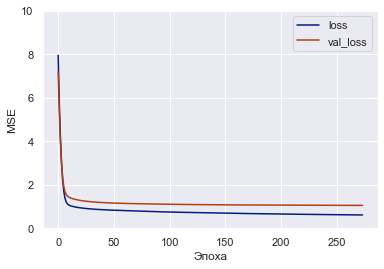

In [157]:
 plot_loss(history)

In [158]:
test_results = {}
test_results['SMNmp_264_sgd'] = SMNmp_264_sgd.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_264_sgd': 0.9659191370010376}

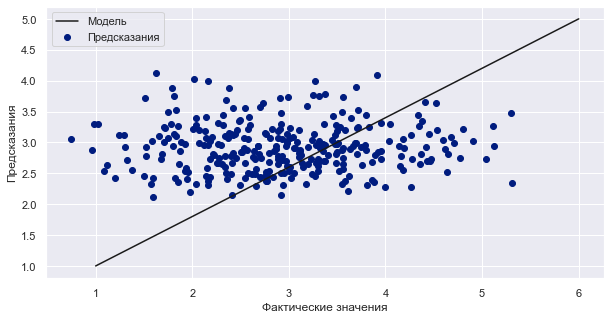

In [159]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_264_sgd.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [160]:
df_SMNmp4 = errorsns(SMNmp_264_sgd, X_train, X_test, y_train, y_test,
       name = 'SMNmp_264_sgd', trg = 'Соотношение матрица-наполнитель')
df_SMNmp4

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_264_sgd,Соотношение матрица-наполнитель,0.790333,0.639862,0.965919,0.616348


In [161]:
def build_and_compile_model(normalizer):
    model5 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'), 
      layers.Dense(1)
    ])

    model5.compile(optimizer=tf.keras.optimizers.SGD(0.001),
                loss='mean_squared_error')
    return model5

In [162]:
SMNmp_364_sgd = build_and_compile_model(normalizer)
SMNmp_364_sgd.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_18 (Dense)            (None, 64)                832       
                                                                 
 dense_19 (Dense)            (None, 64)                4160      
                                                                 
 dense_20 (Dense)            (None, 64)                4160      
                                                                 
 dense_21 (Dense)            (None, 1)                 65        
                                                                 
Total params: 9,242
Trainable params: 9,217
Non-trainable params: 25
___________________________________________________

In [163]:
%%time
history = SMNmp_364_sgd.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 229.
Epoch 239: early stopping
Wall time: 14.4 s


In [164]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)  

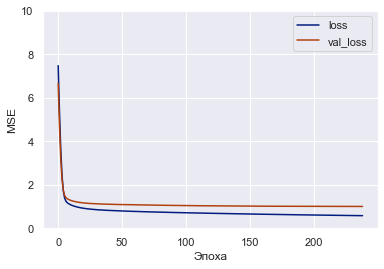

In [165]:
 plot_loss(history)

In [166]:
test_results = {}
test_results['SMNmp_364_sgd'] = SMNmp_364_sgd.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_364_sgd': 0.9354130029678345}

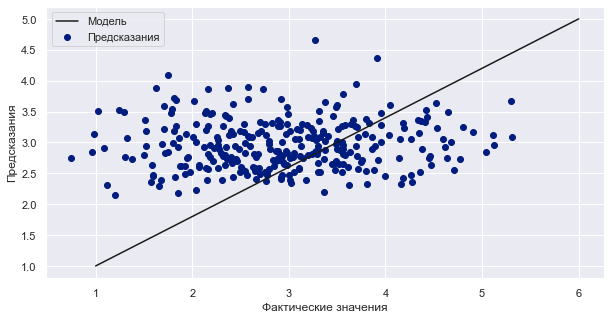

In [167]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_364_sgd.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [168]:
df_SMNmp5 = errorsns(SMNmp_364_sgd, X_train, X_test, y_train, y_test,
       name = 'SMNmp_364_sgd', trg = 'Соотношение матрица-наполнитель')
df_SMNmp5

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_364_sgd,Соотношение матрица-наполнитель,0.77329,0.63194,0.935413,0.585605


In [169]:
def build_and_compile_model(normalizer):
    model6 = keras.Sequential([
      normalizer,
      layers.Dense(128, activation='relu'),
      layers.Dense(128, activation='relu'),
      layers.Dense(128, activation='relu'), 
      layers.Dense(1)
    ])

    model6.compile(optimizer=tf.keras.optimizers.SGD(0.001),
                loss='mean_squared_error')
    return model6

In [170]:
SMNmp_3128_sgd = build_and_compile_model(normalizer)
SMNmp_3128_sgd.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_22 (Dense)            (None, 128)               1664      
                                                                 
 dense_23 (Dense)            (None, 128)               16512     
                                                                 
 dense_24 (Dense)            (None, 128)               16512     
                                                                 
 dense_25 (Dense)            (None, 1)                 129       
                                                                 
Total params: 34,842
Trainable params: 34,817
Non-trainable params: 25
_________________________________________________

In [171]:
%%time
history = SMNmp_3128_sgd.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 248.
Epoch 258: early stopping
Wall time: 16.3 s


In [172]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)  

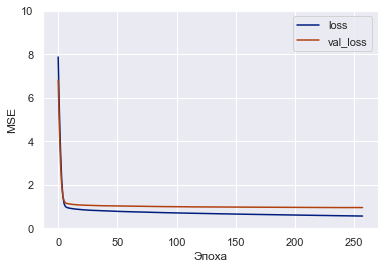

In [173]:
 plot_loss(history)

In [174]:
test_results = {}
test_results['SMNmp_3128_sgd'] = SMNmp_364_sgd.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_3128_sgd': 0.9354130029678345}

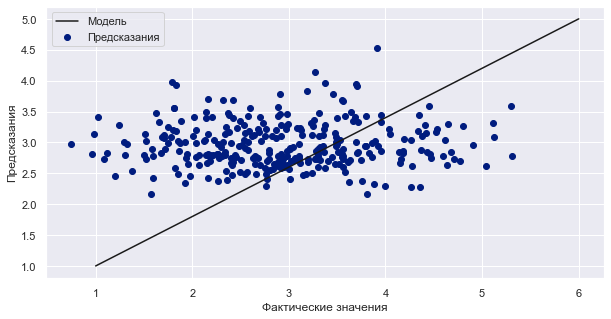

In [175]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_3128_sgd.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [176]:
df_SMNmp6 = errorsns(SMNmp_3128_sgd, X_train, X_test, y_train, y_test,
       name = 'SMNmp_3128_sgd', trg = 'Соотношение матрица-наполнитель')
df_SMNmp6

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_3128_sgd,Соотношение матрица-наполнитель,0.781486,0.617893,0.934463,0.568791


In [177]:
def build_and_compile_model(normalizer):
    model7 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
    ])

    model7.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.01),
                loss='mean_squared_error')
    return model7

In [178]:
SMNmp_264_RMSprop = build_and_compile_model(normalizer)
SMNmp_264_RMSprop.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_26 (Dense)            (None, 64)                832       
                                                                 
 dense_27 (Dense)            (None, 64)                4160      
                                                                 
 dense_28 (Dense)            (None, 1)                 65        
                                                                 
Total params: 5,082
Trainable params: 5,057
Non-trainable params: 25
_________________________________________________________________


In [179]:
%%time
history = SMNmp_264_RMSprop.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 5.
Epoch 15: early stopping
Wall time: 1.91 s


In [180]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)  

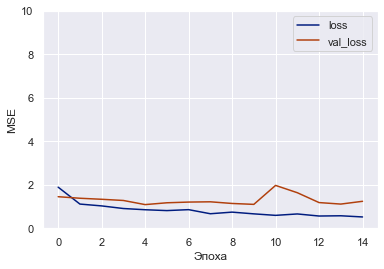

In [181]:
plot_loss(history)

In [182]:
test_results = {}
test_results['264_RMSprop'] = SMNmp_264_RMSprop.evaluate(X_test, y_test, verbose=0)
test_results

{'264_RMSprop': 1.0477901697158813}

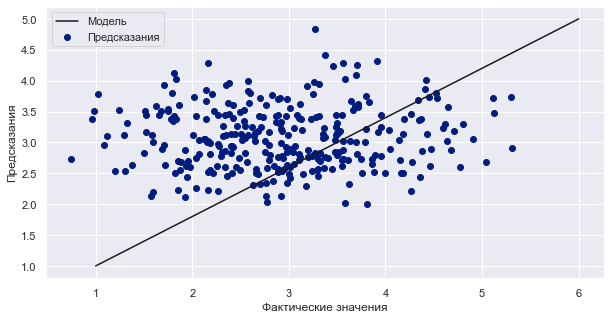

In [183]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_264_RMSprop.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [184]:
df_SMNmp7 = errorsns(SMNmp_264_RMSprop, X_train, X_test, y_train, y_test,
       name = 'SMNmp_264_RMSprop', trg = 'Соотношение матрица-наполнитель')
df_SMNmp7

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_264_RMSprop,Соотношение матрица-наполнитель,0.835993,0.658204,1.04779,0.635793


In [185]:
def build_and_compile_model(normalizer):
    model8 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),  
      layers.Dense(1)
    ])

    model8.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.01),
                loss='mean_squared_error')
    return model8

In [186]:
SMNmp_364_RMSprop = build_and_compile_model(normalizer)
SMNmp_364_RMSprop.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_29 (Dense)            (None, 64)                832       
                                                                 
 dense_30 (Dense)            (None, 64)                4160      
                                                                 
 dense_31 (Dense)            (None, 64)                4160      
                                                                 
 dense_32 (Dense)            (None, 1)                 65        
                                                                 
Total params: 9,242
Trainable params: 9,217
Non-trainable params: 25
__________________________________________________

In [187]:
%%time
history = SMNmp_364_RMSprop.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 10.
Epoch 20: early stopping
Wall time: 2.78 s


In [188]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)  

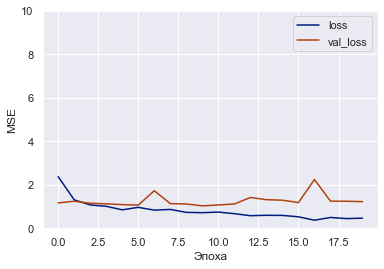

In [189]:
plot_loss(history)

In [190]:
test_results = {}
test_results['364_RMSprop'] = SMNmp_364_RMSprop.evaluate(X_test, y_test, verbose=0)
test_results

{'364_RMSprop': 1.0559903383255005}

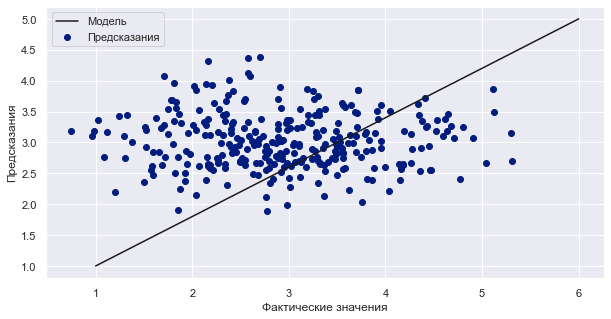

In [191]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_364_RMSprop.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [192]:
df_SMNmp8 = errorsns(SMNmp_364_RMSprop, X_train, X_test, y_train, y_test,
       name = 'SMNmp_364_RMSprop', trg = 'Соотношение матрица-наполнитель')
df_SMNmp8

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_364_RMSprop,Соотношение матрица-наполнитель,0.827664,0.597615,1.05599,0.556347


In [193]:
def build_and_compile_model(normalizer):
    model9 = keras.Sequential([
      normalizer,
      layers.Dense(128, activation='relu'),
      layers.Dense(128, activation='relu'),
      layers.Dense(128, activation='relu'),  
      layers.Dense(1)
    ])

    model9.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.01),
                loss='mean_squared_error')
    return model9

In [194]:
SMNmp_3128_RMSprop = build_and_compile_model(normalizer)
SMNmp_3128_RMSprop.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_33 (Dense)            (None, 128)               1664      
                                                                 
 dense_34 (Dense)            (None, 128)               16512     
                                                                 
 dense_35 (Dense)            (None, 128)               16512     
                                                                 
 dense_36 (Dense)            (None, 1)                 129       
                                                                 
Total params: 34,842
Trainable params: 34,817
Non-trainable params: 25
________________________________________________

In [195]:
%%time
history = SMNmp_3128_RMSprop.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 7.
Epoch 17: early stopping
Wall time: 2.06 s


In [196]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True) 

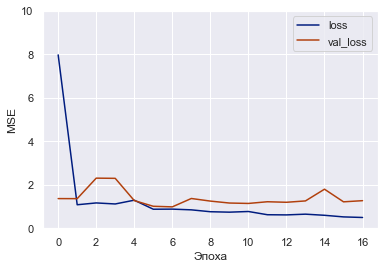

In [197]:
plot_loss(history)

In [198]:
test_results = {}
test_results['SMNmp_3128_RMSprop'] = SMNmp_3128_RMSprop.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_3128_RMSprop': 0.9325605034828186}

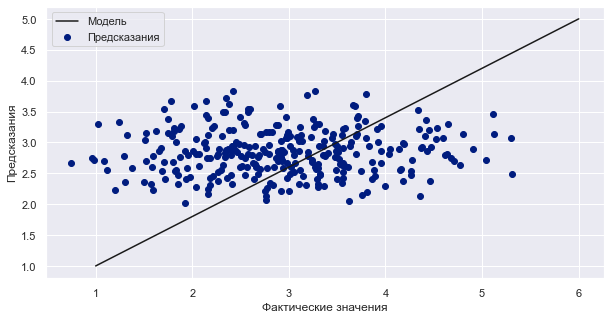

In [199]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_3128_RMSprop.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [200]:
df_SMNmp9 = errorsns(SMNmp_3128_RMSprop, X_train, X_test, y_train, y_test,
       name = 'SMNmp_3128_RMSprop', trg = 'Соотношение матрица-наполнитель')
df_SMNmp9

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_3128_RMSprop,Соотношение матрица-наполнитель,0.777032,0.647029,0.932561,0.647218


In [201]:
df_SMNmp_svod = pd.concat([df_SMNmp1, df_SMNmp2, df_SMNmp3, df_SMNmp4, df_SMNmp5, df_SMNmp6, df_SMNmp7, df_SMNmp8, df_SMNmp9], axis=0).reset_index(drop = True)
df_SMNmp_svod

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_264_adam,Соотношение матрица-наполнитель,0.810042,0.458006,1.032922,0.327554
1,SMNmp_364_adam,Соотношение матрица-наполнитель,0.814787,0.563440,1.038105,0.485206
2,SMNmp_3128_adam,Соотношение матрица-наполнитель,0.849522,0.464786,1.121273,0.339146
3,SMNmp_264_sgd,Соотношение матрица-наполнитель,0.790333,0.639862,0.965919,0.616348
4,SMNmp_364_sgd,Соотношение матрица-наполнитель,0.773290,0.631940,0.935413,0.585605
5,SMNmp_3128_sgd,Соотношение матрица-наполнитель,0.781486,0.617893,0.934463,0.568791
6,SMNmp_264_RMSprop,Соотношение матрица-наполнитель,0.835993,0.658204,1.047790,0.635793
7,SMNmp_364_RMSprop,Соотношение матрица-наполнитель,0.827664,0.597615,1.055990,0.556347
8,SMNmp_3128_RMSprop,Соотношение матрица-наполнитель,0.777032,0.647029,0.932561,0.647218


In [202]:
def build_and_compile_model(normalizer):
    model10 = keras.Sequential([
      normalizer,
      layers.Dense(128, activation='relu'),
      layers.Dropout(0.1),
      layers.Dense(128, activation='relu'),
      layers.Dropout(0.1),  
      layers.Dense(128, activation='relu'),
      layers.Dropout(0.1),  
      layers.Dense(1)
    ])

    model10.compile(optimizer=tf.keras.optimizers.Adam(0.001),
                loss='mean_squared_error')
    return model10

In [203]:
SMNmp_3128_adamdrop = build_and_compile_model(normalizer)
SMNmp_3128_adamdrop.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_37 (Dense)            (None, 128)               1664      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_38 (Dense)            (None, 128)               16512     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_39 (Dense)            (None, 128)               16512     
                                                     

In [204]:
%%time
history = SMNmp_3128_adamdrop.fit(
    X_train,
    y_train,
    epochs=1023,
    verbose=0,
    callbacks=[callback],
    validation_data=(X_val, y_val))

Restoring model weights from the end of the best epoch: 15.
Epoch 25: early stopping
Wall time: 2.41 s


In [205]:
def plot_loss(history, lim = [0, 10]):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim(lim)
    plt.xlabel('Эпоха')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True) 

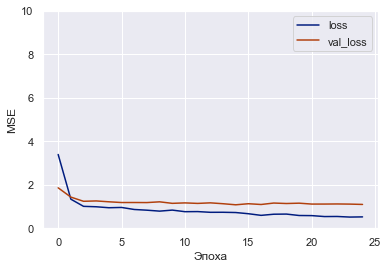

In [206]:
plot_loss(history)

In [207]:
test_results = {}
test_results['SMNmp_3128_adamdrop'] = SMNmp_3128_adamdrop.evaluate(X_test, y_test, verbose=0)
test_results

{'SMNmp_3128_adamdrop': 1.0492167472839355}

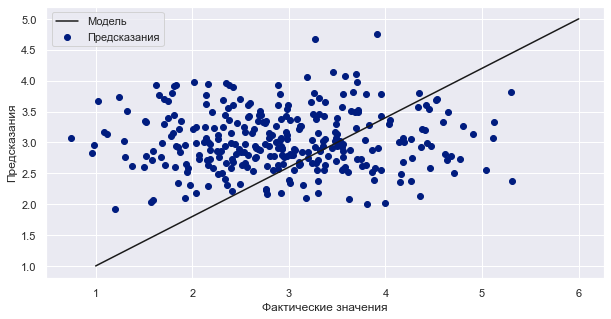

In [208]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, SMNmp_3128_adamdrop.predict(X_test), label='Предсказания')
plt.plot([1, 6], [1, 5], color='k', label='Модель')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказания')
plt.legend()

In [209]:
df_SMNmp10 = errorsns(SMNmp_3128_adamdrop, X_train, X_test, y_train, y_test,
       name = 'SMNmp_3128_adamdrop', trg = 'Соотношение матрица-наполнитель')
df_SMNmp10

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNmp_3128_adamdrop,Соотношение матрица-наполнитель,0.819839,0.620589,1.049217,0.563144


In [210]:
df_SMN_itog = pd.concat([df_SMN_svod, df_SMNmp_svod, df_SMNmp10], axis=0).reset_index(drop = True)
df_SMN_itog

,Модель,Целевой параметр,MAE(test),MAE(train),MSE(test),MSE(train)
0,SMNlin_model1,Соотношение матрица-наполнитель,0.768106,0.700065,0.892849,0.777362
1,SMNlin_model2,Соотношение матрица-наполнитель,0.743408,0.702235,0.850640,0.766792
2,SMNlin_model3,Соотношение матрица-наполнитель,0.726577,0.711425,0.819655,0.780347
3,SMNlin_model4,Соотношение матрица-наполнитель,0.736500,0.687957,0.831790,0.749356
4,SMNmp_264_adam,Соотношение матрица-наполнитель,0.810042,0.458006,1.032922,0.327554
5,SMNmp_364_adam,Соотношение матрица-наполнитель,0.814787,0.563440,1.038105,0.485206
6,SMNmp_3128_adam,Соотношение матрица-наполнитель,0.849522,0.464786,1.121273,0.339146
7,SMNmp_264_sgd,Соотношение матрица-наполнитель,0.790333,0.639862,0.965919,0.616348
8,SMNmp_364_sgd,Соотношение матрица-наполнитель,0.773290,0.631940,0.935413,0.585605
9,SMNmp_3128_sgd,Соотношение матрица-наполнитель,0.781486,0.617893,0.934463,0.568791


In [234]:
# Выгрузим модель
SMNmp_3128_adamdrop.save("C:\models/SMNmp")

INFO:tensorflow:Assets written to: C:\models/SMNmp\assets
